# **Question 1**



In [12]:
# Mount Google Drive to access the Excel file
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


We start by loading the necessary libraries and the data that we are going to use for our analysis.  We are thus setting up an environment for our analysis, by importing the libraries needed for the whole notebook and the dataset we are using. Among the libraries used there are SciKit-Learn, Keras on top of TensorFlow and the usual NumPy, Pandas and Matplotlib.

In [13]:
import pandas as pd
import statistics
import numpy as np
import matplotlib.pyplot as plt
import warnings
import tensorflow as tf
from tensorflow import keras
import sys


## **Preprocessing**
We import our data of 3000 observations and we split it into 3 sets: Train, Test, and Validation of 1000 observations each.

To our 9 explanatory variables, we add one-step lags and leads, resulting in a total of 27 features.

We chose not to permute the data since we suspect that there might be some autocorrelation.

In [14]:
file_path= '/content/drive/MyDrive/Fintech20902_year_2024/takehome20902data.xlsx'

df = pd.read_excel(file_path, index_col=0)

In [15]:
x = ["x"+str(i+1) for i in range(9)]
y = ["y"+str(i+1) for i in range(3)]

X = df[x]

for col in X.columns:
    X[col + '_lag'] = X[col].shift(1)
    X[col + '_lead'] = X[col].shift(-1)

Xtrain = X[1:999]
Xtest = X[1001:1999]
Xvalid = X[2001:2999]

ytrain = df[y][1:999]
ytest = df[y][1001:1999]
yvalid = df[y][2001:2999]

<ipython-input-15-27e5f427cb8a>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col + '_lag'] = X[col].shift(1)
<ipython-input-15-27e5f427cb8a>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col + '_lead'] = X[col].shift(-1)


## **Preliminary Analysis**

First of all, we did some exploratory data analysis and noticed that the Y variables do not display any significant dependence. This can be checked by inspecting the scatter plots, computing correlation, and computing the mutual information for capturing both linear and non-linear kinds of dependence.

Since there is likely no dependence, we chose to model the three variables separately, rather than jointly. The latter method could result in undesirable regularization/shrinkage.

## **Decision Tree Regressor with Bagging**

We do not have any domain knowledge or the context behind the data. Thus, we take a data-driven approach. The first model we try is a decision tree regressor with bagging. This model is very flexible and it will allow us to fit any function. We will use the resulting $R^2$ as a benchmark to evaluate other models.

The scale of the data is approximately the same, so we will not transform it to maintain interpretability.

To select the number of estimators that best fits the model while avoiding overfitting we rely on the test set.

In [16]:
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

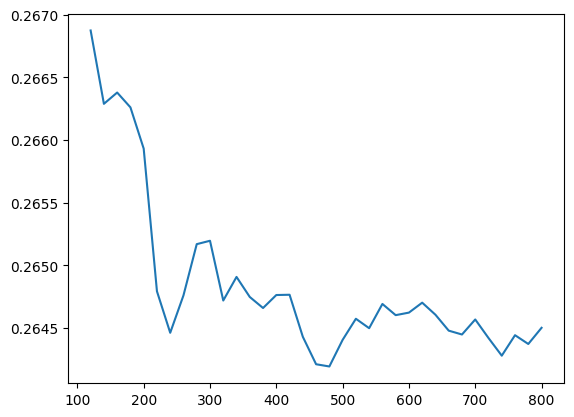

y1  best parameter: 480
mse: 0.27021049774129746
pseudo R2: 0.37823367795577234


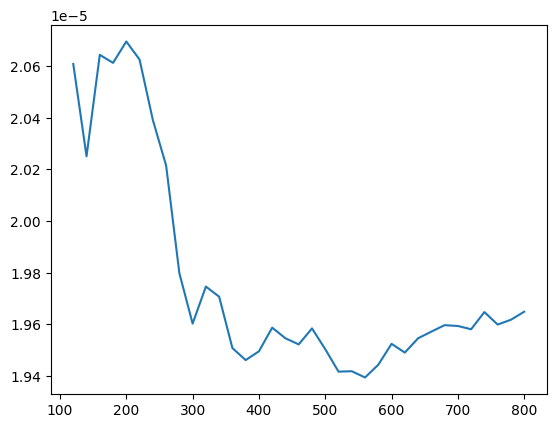

y2  best parameter: 560
mse: 1.7467503374492016e-05
pseudo R2: 0.9978304584455889


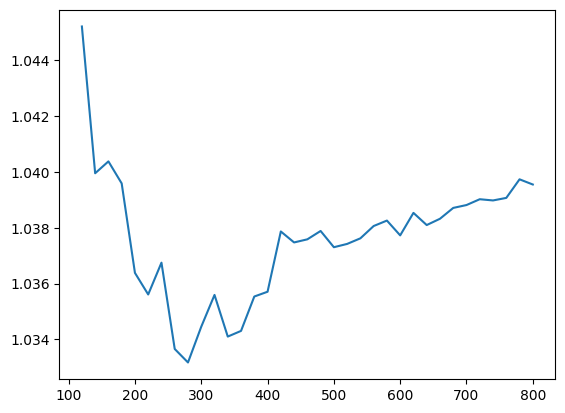

y3  best parameter: 280
mse: 1.0738510150097789
pseudo R2: -0.0048179365274316766


In [17]:
grid = {
'n_estimators': [i for i in range(120, 801, 20)]
}

tree = DecisionTreeRegressor()
bagging_result = []

for k in range(1,4):
  y = "y"+str(k)

  bagging = BaggingRegressor(tree, n_estimators=100, max_samples=800, random_state=42, warm_start=True)

  n_estimators_list = []
  mse_list = []

  for i in grid["n_estimators"]:

    bagging.set_params(n_estimators=i)
    bagging.fit(Xtrain, ytrain[y])
    predict = bagging.predict(Xtest)

    mse = mean_squared_error(ytest[y], predict)

    n_estimators_list.append(i)
    mse_list.append(mse)

  plt.plot(n_estimators_list, mse_list)
  plt.show()

  best_param = n_estimators_list[mse_list.index(min(mse_list))]

  bagging = BaggingRegressor(tree, n_estimators=best_param, random_state=42)

  bagging.fit(Xtrain, ytrain[y])
  predict = bagging.predict(Xvalid)

  mse = mean_squared_error(yvalid[y], predict)
  pseudo_R2 = 1 - mse/statistics.variance(yvalid[y])

  print(y," best parameter:", best_param)
  print("mse:", mse)
  print("pseudo R2:", pseudo_R2)
  bagging_result.append(pseudo_R2)

## **Linear Model**

We now try a linear model to check if it can do better than the bagging model. We look for the explanatory variables that have the highest correlation with our dependent variables. We also add lags, leads and interaction factors.

In [18]:
x = ["x"+str(i+1) for i in range(9)]
y = ["y"+str(i+1) for i in range(3)]

X = df[x]

for col in X.columns:
    X[col + '_lag'] = X[col].shift(1)
    X[col + '_lead'] = X[col].shift(-1)

Xtrain = X[1:999]
Xtest = X[1001:1999]
Xvalid = X[2001:]

ytrain = df[y][1:999]
ytest = df[y][1001:1999]
yvalid = df[y][2001:]

<ipython-input-18-f68fbe46749c>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col + '_lag'] = X[col].shift(1)
<ipython-input-18-f68fbe46749c>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[col + '_lead'] = X[col].shift(-1)


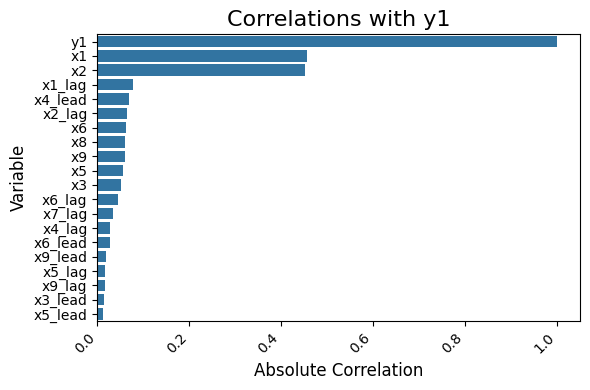

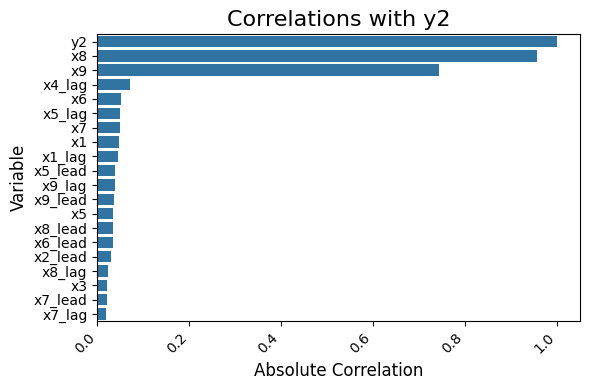

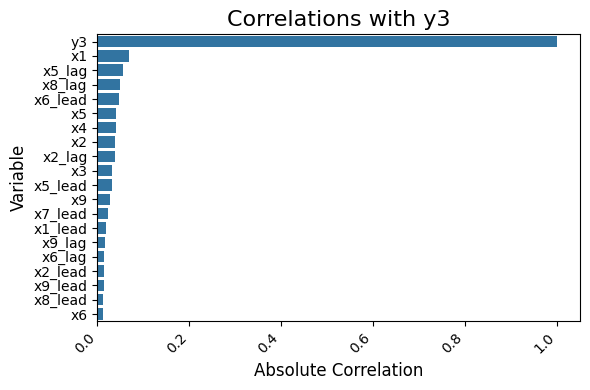

In [19]:
import seaborn as sns

corr = {}

for k in range(1, 4):
  y = "y" + str(k)

  train = pd.concat([Xtrain, ytrain[y]], axis=1)
  corr = train.corr()[y].abs().sort_values(ascending=False)

  plt.figure(figsize=(6, 4))
  sns.barplot(x=corr.values[:20], y=corr.index[:20])
  plt.xlabel('Absolute Correlation', fontsize=12)
  plt.ylabel('Variable', fontsize=12)
  plt.title('Correlations with '+str(y), fontsize=16)

  plt.xticks(rotation=45, ha='right')

  plt.tight_layout()
  plt.show()

The relevant features for $y_1$ seems to be $x_1$ and $x_2$. For $y_2$ they seems to be $x_8$ and $x_9$. There seems to be no relevant features that can predict $y_3$.

It is not clear yet however if the relation between the variables is linear, therefore we plot a 3d scatterplot of the relevant variables.

In [20]:
import plotly.express as px

fig = px.scatter_3d(df, x='x1', y='x2', z='y1', opacity = .1)
fig.show()

fig = px.scatter_3d(df, x='x8', y='x9', z='y2', opacity = .1)
fig.show()

There seems to be a strong linear relation between x1, x2 and y1.

Instead, in the relation between x8, x9 and y2, the interaction factor between x8 and x9 seems to play a relevant role.

We are ready to check if a linear model can beat the random tree with bagging.

In [21]:
from sklearn.linear_model import LinearRegression

In [30]:
y = ["y"+str(i+1) for i in range(3)]
ytrain = df[y][:1000]
yvalid = df[y][2000:]

X1 = df[["x1","x2"]]

Xtrain1 = X1[:1000]
Xtest1 = X1[1000:2000]
Xvalid1 = X1[2000:3000]

X2 = df[["x8","x9"]]
X2["x8*x9"] = X["x8"]*X["x9"]

Xtrain2 = X2[:1000]
Xtest2 = X2[1000:2000]
Xvalid2 = X2[2000:3000]

<ipython-input-30-a188690f84b0>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [31]:
linear_result = []

reg = LinearRegression()

reg.fit(Xtrain1,ytrain["y1"])

predict = reg.predict(Xvalid1)
residuals2 = ytrain["y1"] - reg.predict(Xtrain1)
mse = mean_squared_error(yvalid["y1"], predict)
pseudo_R2 = 1 - mse/statistics.variance(yvalid["y1"])

print("y1")
print("mse:", mse)
print("pseudo R2:", pseudo_R2)
linear_result.append(pseudo_R2)

reg.fit(Xtrain2,ytrain["y2"])

predict = reg.predict(Xvalid2)
residuals2 = ytrain["y2"] - reg.predict(Xtrain2)
mse = mean_squared_error(yvalid["y2"], predict)
pseudo_R2 = 1 - mse/statistics.variance(yvalid["y2"])

print("y2")
print("mse:", mse)
print("pseudo R2:", pseudo_R2)
linear_result.append(pseudo_R2)

predict = np.repeat(statistics.mean(ytrain["y3"]), 1000)
residuals3 = ytrain["y3"] - predict
mse = mean_squared_error(yvalid["y3"], predict)
pseudo_R2 = 1 - mse/statistics.variance(yvalid["y3"])

print("y3")
print("mse:", mse)
print("pseudo R2:", pseudo_R2)
linear_result.append(pseudo_R2)

for i in range(3):
  improvement = linear_result[i] - bagging_result[i]
  print("improvement in R2 for y" + str(i+1) + ": {:.5f}".format(improvement))

y1
mse: 0.2636561358300686
pseudo R2: 0.3922367782604034
y2
mse: 1.1653083493721722e-05
pseudo R2: 0.9985507988423747
y3
mse: 1.0686061066126384
pseudo R2: -0.0014498695555567043
improvement in R2 for y1: 0.01400
improvement in R2 for y2: 0.00072
improvement in R2 for y3: 0.00337


In [ ]:
print(residuals3)
type(residuals3)

nobs
1      -0.632346
2       0.471886
3      -0.329726
4      -0.413705
5      -1.013062
          ...   
996    -1.281034
997     1.314196
998    -0.358806
999     0.420000
1000   -1.826016
Name: y3, Length: 1000, dtype: float64


pandas.core.series.Series

Our linear model is able to beat the decision tree regressor with bagging in all the variables. We claim we made the best possible prediction for the 3 variables.

## **Focus on y3**

Since y3 is not correlated with any of the features, it is simply modeled as noise. However, it might still be autocorrelated or correlated with some function of the features. To check this, let us first look for some correlation within the lags:

In [ ]:
def optimal_lags_correlation(data, target, features, max_lag):

    optimal_lags = {}
    for feature in features:
        best_lag = 0
        best_corr = 0
        for lag in range(1, max_lag + 1):
            shifted_series = data[feature].shift(lag)
            corr = data[target].corr(shifted_series)
            if abs(corr) > abs(best_corr):
                best_corr = corr
                best_lag = lag
        optimal_lags[feature] = (best_lag, best_corr)
    return optimal_lags


features = ['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9']
optimal_lags = optimal_lags_correlation(df, 'y3', features, 1000)
optimal_lags


{'x1': (241, -0.06916316007464648),
 'x2': (695, 0.06518766974559334),
 'x3': (954, 0.06889223261716781),
 'x4': (707, -0.0704157839510991),
 'x5': (978, -0.07412385601891322),
 'x6': (411, -0.06680536409581951),
 'x7': (519, 0.06790636077692008),
 'x8': (782, -0.06853085571019318),
 'x9': (143, -0.06667188844853003)}

Let us check some functions of the x variables. These will include the second and third degree monomials in x_i, as well as ratios of pairs of x_i and logarithms of each x_i.

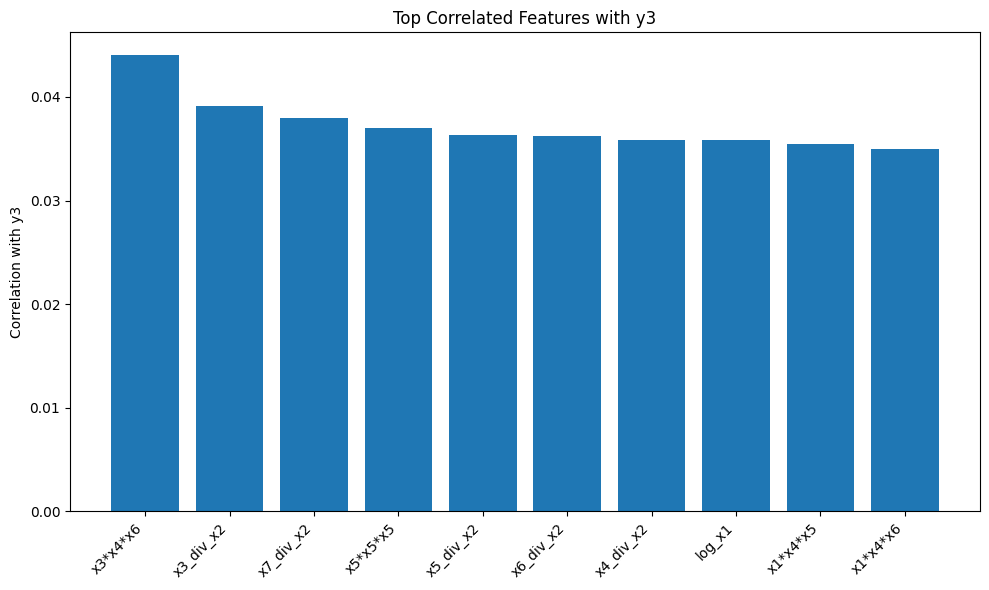

In [ ]:
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
df_augmented = df

for i in range(1, 10):
    for j in range(i, 10):
        df_augmented[f'x{i}*x{j}'] = df_augmented[f'x{i}'] * df_augmented[f'x{j}']

for i in range(1, 10):
    for j in range(i, 10):
      for k in range(j,10):
        df_augmented[f'x{i}*x{j}*x{k}'] = df_augmented[f'x{i}'] * df_augmented[f'x{j}']* df_augmented[f'x{k}']

for i in range(1, 10):
    for j in range(1, 10):
        if i != j:
            df_augmented[f'x{i}_div_x{j}'] = df_augmented[f'x{i}'] / (df_augmented[f'x{j}'])

for i in range(1, 10):
    df_augmented[f'log_x{i}'] = np.log(df_augmented[f'x{i}'])

df_augmented = df_augmented.replace([np.inf,np.NINF], np.nan).fillna(0)


correlations = df_augmented.corr()['y3'].drop('y3')

sorted_correlations = correlations.abs().sort_values(ascending=False)

top_correlated = sorted_correlations.head(10)

plt.figure(figsize=(10, 6))
plt.bar(top_correlated.index, top_correlated.values)
plt.ylabel('Correlation with y3')
plt.title('Top Correlated Features with y3')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Since none of these variables appear to be strongly correlated with y3, we conclude that modeling it as noise might be adequate.

After all, we tried to force a stacking model with everything we have in our power, even by extending the training data, but, again, we failed to consistently model Y3.

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import StackingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

X1_train, X1_test, y1_train, y1_test = train_test_split(df[features], df['y3'], random_state=42)

stacking_reg = StackingRegressor(estimators=[
    ('lr', LinearRegression()),
    ('rf1', RandomForestRegressor(n_estimators=500, n_jobs=-1, random_state=42)),
    ('svr1', SVR())
], final_estimator=RandomForestRegressor(n_estimators=100, random_state=43))

stacking_reg.fit(X1_train, y1_train)
y_pred_stacking = stacking_reg.predict(X1_test)

RMSE on Test Data: 1.098333182474689
MAPE on Test Data: 3222.1891022141954


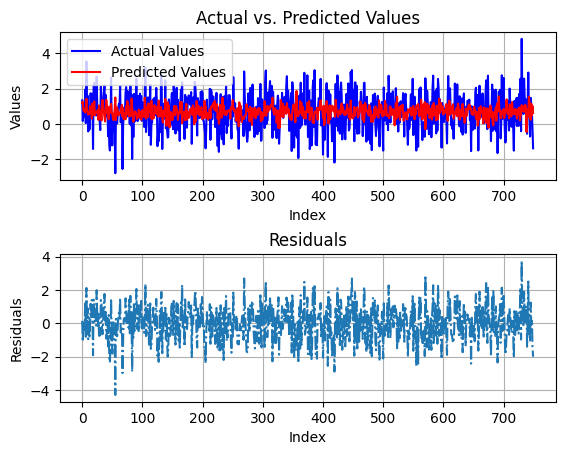

In [ ]:
rmse_stacking = np.sqrt(mean_squared_error(y1_test, y_pred_stacking))
mape_stacking = np.mean(np.abs((y1_test - y_pred_stacking) / y1_test)) * 100
print("RMSE on Test Data:", rmse_stacking)
print("MAPE on Test Data:", mape_stacking)
if isinstance(y1_test, pd.Series):
    y1_test = y1_test.reset_index(drop=True)

index = np.arange(len(y1_test))

residuals = []
for i in range(len(index)):
    residuals.append(y1_test[i] -  y_pred_stacking[i])


fig, axs = plt.subplots(2)
axs[0].set_title('Actual vs. Predicted Values')
axs[0].plot(index, y1_test, '-', color='blue', label='Actual Values')
axs[0].plot(index, y_pred_stacking, '-', color='red', label='Predicted Values')
axs[0].set(xlabel='Index' , ylabel='Values')
axs[0].grid(True)
axs[0].legend()



axs[1].plot(index, residuals, '-.')
axs[1].set_title('Residuals')
axs[1].grid
axs[1].set(xlabel='Index' , ylabel='Residuals')
axs[1].grid(True)
fig.subplots_adjust(hspace=0.5)
plt.show()

## **Wide & Deep Neural Network**

As a final approach, we use a multi-output neural network with all the 345 augmented features to try and outperform the linear model prediction. It is important to tune the hyperparameters in a way to prevent overfitting.

First of all, let us split the data once again into a train/test/validate split.

In [ ]:
X_aug = df_augmented.drop(['y1', 'y2', 'y3'],axis=1)


X_aug_train = X_aug[0:999]
X_aug_test = X_aug[1000:1999]
X_aug_valid = X_aug[2000:2999]

ytrain = df_augmented[y][0:999]
ytest = df[y][1000:1999]
yvalid = df[y][2000:2999]

# ytrain, ytest, and yvalid are already defined

Now, using Keras we can build a Wide & Deep Neural Network that can extract both simple and complex relationships between the features. There are two inputs: the wide one and deep one. The Wide input takes in the original featuers themselves, together with the interaction term x8*x9, since we found it to be important for y2. The deep layer takes the rest of the 290 augmented features.

Since the dataset is very high-dimensional for its sample size, we use L1 regularization at each hidden layer (the deafult amount of 0.01), as well as add dropout layers after each hidden layer. The hyperparameters were tuned to result in the optimal prediction.

In [ ]:
tf.random.set_seed(42)

input_wide = tf.keras.layers.Input(shape=[10]) # We only want x_1...x_9 and x_8*x_9 to go through the wide path. All other features go through the deep path
input_deep = tf.keras.layers.Input(shape=[290])
norm_layer_wide = tf.keras.layers.Normalization()
norm_layer_deep = tf.keras.layers.Normalization()
norm_wide = norm_layer_wide(input_wide)
norm_deep = norm_layer_deep(input_deep)
hidden1 = tf.keras.layers.Dense(50, activation="relu", kernel_regularizer='l1')(norm_deep)
dropout1 = tf.keras.layers.Dropout(0.3)(hidden1)
hidden2 = tf.keras.layers.Dense(20, activation="relu", kernel_regularizer='l1')(dropout1)
dropout2 = tf.keras.layers.Dropout(0.3)(hidden2)

concat = tf.keras.layers.concatenate([norm_wide, dropout2])

output1 = tf.keras.layers.Dense(1)(concat)
output2 = tf.keras.layers.Dense(1)(concat)
output3 = tf.keras.layers.Dense(1)(concat)

model = tf.keras.Model(inputs=[input_wide, input_deep], outputs=[output1, output2, output3])

optimizer = tf.keras.optimizers.Adam(learning_rate=0.005)
model.compile(loss=("mse","mse","mse"), loss_weights=(0.33,0.33,0.34), optimizer=optimizer, metrics=["MeanSquaredError"])


X_train_wide, X_train_deep = X_aug_train[['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x8*x9']], X_aug_train.drop(columns=['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x8*x9'])
X_valid_wide, X_valid_deep = X_aug_valid[['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x8*x9']], X_aug_valid.drop(columns=['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x8*x9'])
X_test_wide, X_test_deep = X_aug_test[['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x8*x9']], X_aug_test.drop(columns=['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x8*x9'])


norm_layer_wide.adapt(X_train_wide)
norm_layer_deep.adapt(X_train_deep)

history = model.fit((X_train_wide, X_train_deep), (ytrain['y1'], ytrain['y2'], ytrain['y3']), epochs=40, batch_size=32,
 validation_data=((X_valid_wide, X_valid_deep), (yvalid['y1'],yvalid['y2'],yvalid['y3'])))
mse_test = model.evaluate((X_test_wide, X_test_deep), (ytest['y1'],ytest['y2'],ytest['y3']))

y_pred = model.predict((X_test_wide, X_test_deep))
tf.debugging.enable_check_numerics()


Epoch 1/40
32/32 [==============================] - 14s 184ms/step - loss: 8.0312 - dense_15_loss: 0.7535 - dense_16_loss: 0.3843 - dense_17_loss: 1.5414 - dense_15_mean_squared_error: 0.7535 - dense_16_mean_squared_error: 0.3843 - dense_17_mean_squared_error: 1.5414 - val_loss: 4.5514 - val_dense_15_loss: 0.7731 - val_dense_16_loss: 0.1887 - val_dense_17_loss: 1.4091 - val_dense_15_mean_squared_error: 0.7731 - val_dense_16_mean_squared_error: 0.1887 - val_dense_17_mean_squared_error: 1.4091
Epoch 2/40
32/32 [==============================] - 4s 133ms/step - loss: 2.8158 - dense_15_loss: 0.4368 - dense_16_loss: 0.0898 - dense_17_loss: 1.1307 - dense_15_mean_squared_error: 0.4368 - dense_16_mean_squared_error: 0.0898 - dense_17_mean_squared_error: 1.1307 - val_loss: 1.9008 - val_dense_15_loss: 0.7207 - val_dense_16_loss: 0.0488 - val_dense_17_loss: 1.2847 - val_dense_15_mean_squared_error: 0.7207 - val_dense_16_mean_squared_error: 0.0488 - val_dense_17_mean_squared_error: 1.2847
Epoch 3

Here is how the prediction looks for the test set:

32/32 [==============================] - 1s 41ms/step


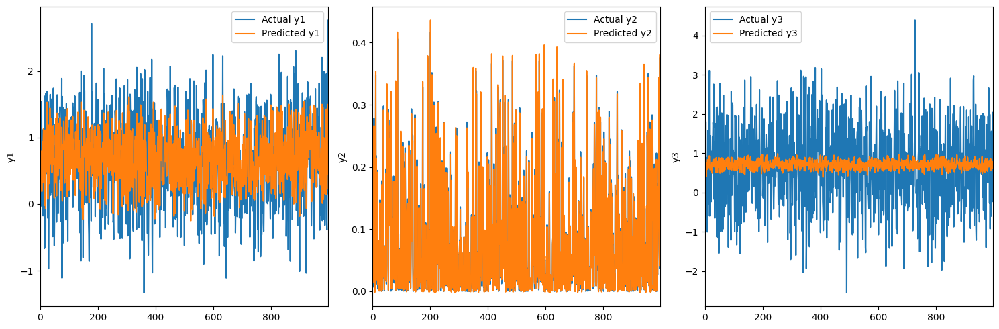

In [ ]:
y_pred = model.predict((X_test_wide, X_test_deep))

y1_pred = y_pred[0].flatten()
y2_pred = y_pred[1].flatten()
y3_pred = y_pred[2].flatten()

y1_actual = ytest['y1'].values
y2_actual = ytest['y2'].values
y3_actual = ytest['y3'].values

fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))

ax1.plot(y1_actual, label='Actual y1')
ax1.plot(y1_pred, label='Predicted y1')
ax1.set_ylabel('y1')
ax1.legend()
ax1.set_xlim(0, len(y1_actual)-1)

ax2.plot(y2_actual, label='Actual y2')
ax2.plot(y2_pred, label='Predicted y2')
ax2.set_ylabel('y2')
ax2.legend()
ax2.set_xlim(0, len(y2_actual)-1)

ax3.plot(y3_actual, label='Actual y3')
ax3.plot(y3_pred, label='Predicted y3')
ax3.set_ylabel('y3')
ax3.legend()
ax3.set_xlim(0, len(y3_actual)-1)

plt.tight_layout()
plt.show()

The plot below confirms that the regularization was enough to prevent overfitting. Although the model might be somewhat underfit, this is the best result given limited data and a high number of features.

In [ ]:
pd.DataFrame(history.history)[['loss','val_loss']].plot(
 figsize=(8, 5), xlim=[0, 40], ylim=[0,10], grid=True, xlabel="Epoch",
 style=["r--",  "b--"])
plt.show()

The MSEs are the following:  0.2655  for Y1, 2.5601e-05 for Y2, and 1.041 for Y3. Thus, the linear regression approach beats the Wide and Deep Neural Network in terms of prediction error and parsimony.

## **Methodology and Rationale**
To address the forecasting challenge, we initially employed a bagging model using a decision tree regressor, aiming to exploit the model's flexibility in handling nonlinear relationships within the data. By bagging multiple trees, we intended to reduce overfitting and enhance the model's predictive robustness.

We then implemented a linear regression model after conducting a correlation analysis that indicated linear relationships between certain variables. This approach was chosen for its straightforwardness and efficiency in modeling linear dependencies.

Lastly, we developed a multi-output Wide and Deep Neural Network with extensive feature engineering, aiming to capture complex, nonlinear interactions. This model sought to leverage the augmented dataset's high dimensionality to uncover subtle relationships that simpler models might overlook.

## **Strengths and Weaknesses of Results**

**Decision Tree Regressor with Bagging**

- **Strengths**: Despite its complexity, the model performed well with y1 and y2, providing a reasonable baseline by handling nonlinearities.
- **Weaknesses**: It struggled to generalize effectively, particularly for y3, which lacked significant feature correlation, leading to high variance and overfitting issues.

**Linear Regression**

- **Strengths**: The linear regression model outperformed the bagging model across all targets (y1, y2, and y3). Its simplicity and interpretability allowed us to identify key predictors quickly and effectively.
- **Weaknesses**: The linear regression approach couldn't capture the nonlinear interactions that might exist, which could have limited its predictive capability for certain targets.

**Wide and Deep Neural Network**

- **Strengths**: The neural network captured had the possibility to capture intricate relationships in the data due to its deep architecture, while not neglecting the strong relationships between the variables that were already identified (in particular x1, x2, x8, x9, and x8*x9) thanks to its wide layer. Modeling the three outcomes jointly adds extra regularization while taking into account the complex dependence structure.

- **Weaknesses**: Despite rigorous regularization and feature engineering, the model could not generalize to the test data better than simple linear regression. Adding more layers or features would result in overfitting, meaning that this network extracted all of the

# **Question 2**


To answer this question, we explore different hedging strategies to manage the P&L. Starting with the traditional delta hedging as a baseline, we aim to enhance it using statistical hedging approaches.

First, we try by implementing a regression model to predict optimal hedge ratios, aiming to refine delta hedging by better aligning hedge ratios with market conditions.

In addition to this approach, we also implemented two LSTM Neural Network models. The LSTM models operate under the assumption of a Markov structure in the data, considering a form of conditional independence between options, given the underlying up to the previous period.

Finally, we implemented a Dual-Branch Neural Network.

Through comparing the cumulative P&L results from each strategy, we assess the effectiveness of statistical hedging models in outperforming traditional delta hedging.

In [ ]:
# Mount Google Drive to access the Excel file
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

In [ ]:
excel_path = '/content/drive/MyDrive/Fintech20902_year_2024/takehome20902data.xlsx'
data = pd.read_excel(excel_path, sheet_name=1)

## **Delta Hedging & Statistical Hedging with Linear Regression Model**
In this section, we delve into statistical hedging using a linear regression model. The core objective is to refine the hedge ratio by better predicting option deltas. We build a regression model utilizing features such as the futures price, moneynesses, and time-to-maturity, all of which are known to influence option prices. Our target variable is the delta values of the options.

The linear regression model learns to predict hedge ratios that adapt to market conditions. This allows for a more precise hedge adjustment in response to fluctuations in the underlying asset's price.

To validate the efficacy of our approach, we compare the cumulative P&L results between the linear regression-based statistical hedging and traditional delta hedging. This provides a clear assessment of whether the regression model is improving the hedging strategy.

### **Preprocessing**

We started by defining the names of the columns that hold relevant data for futures prices, option prices, and option deltas.

Also, we stored the names of columns containing option prices and their respective delta values for different strikes and option types.

In [ ]:
# Define the relevant columns
date_column = 'Date'
futures_price_column = 'CME-MINI S&P 500 INDEX DEC 2023 - SETT. PRICE'
continuous_futures_price_column = 'CME-MINI S&P 500 INDEX CONT. - SETT. PRICE'

# Correct definition of price columns
price_columns = [
    'CALL ISM DEC23 4000',
    'PUT ISM DEC23 4000',
    'CALL ISM DEC23 4200',
    'PUT ISM DEC23 4200',
    'CALL ISM DEC23 4400',
    'PUT ISM DEC23 4400',
    'CALL ISM DEC23 4600',
    'PUT ISM DEC23 4600',
    'CALL ISM DEC23 4800',
    'PUT ISM DEC23 4800'
]

# Correct definition of delta columns
delta_columns = [
    'CALL ISM DEC23 4000 - OPTION DELTA',
    'PUT ISM DEC23 4000 - OPTION DELTA',
    'CALL ISM DEC23 4200 - OPTION DELTA',
    'PUT ISM DEC23 4200 - OPTION DELTA',
    'CALL ISM DEC23 4400 - OPTION DELTA',
    'PUT ISM DEC23 4400 - OPTION DELTA',
    'CALL ISM DEC23 4600 - OPTION DELTA',
    'PUT ISM DEC23 4600 - OPTION DELTA',
    'CALL ISM DEC23 4800 - OPTION DELTA',
    'PUT ISM DEC23 4800 - OPTION DELTA'
]

We ensured that delta values and price differences are correct by shifting and comparing values. This step helps prevent calculation errors.

In [ ]:
# Check to verify deltas
print(data[delta_columns].shift(1).fillna(0))

# Check to see that future price differences are correct
data[futures_price_column].diff().fillna(0)

     CALL ISM DEC23 4000 - OPTION DELTA  PUT ISM DEC23 4000 - OPTION DELTA  \
0                               0.00000                            0.00000   
1                               0.62207                           -0.36184   
2                               0.61612                           -0.36693   
3                               0.64605                           -0.33710   
4                               0.64089                           -0.34167   
..                                  ...                                ...   
458                             0.99655                           -0.00574   
459                             0.99951                           -0.00392   
460                             0.99976                           -0.00328   
461                             0.99996                           -0.00266   
462                             0.99990                           -0.00203   

     CALL ISM DEC23 4200 - OPTION DELTA  PUT ISM DEC23 4200 - O

0        0.00
1      -20.00
2      112.00
3      -19.00
4      -55.00
        ...  
458     33.50
459     18.00
460     18.50
461     19.75
462     62.50
Name: CME-MINI S&P 500 INDEX DEC 2023 - SETT. PRICE, Length: 463, dtype: float64

**Creation of Moneyness feature**

For each option we create a Moneyness feature, which will be used in the linear regression model, in order to improve the fit.

In [ ]:
strikes = [4000,4000,4200,4200,4400,4400,4600,4600,4800,4800]
moneyness_columns=[]

[col for col in data.columns if 'Option P&L' in col]

for idx, price_col in enumerate(price_columns):
    strike_price = strikes[idx]
    if 'CALL' in price_col:
        moneyness = data[futures_price_column]/strike_price #if the option is a CALL, moneyness is given by underlying/strike
    else:
        moneyness=strike_price/data[futures_price_column] #if the option is a PUT, moneyness is given by strike/underlying
    column_name = price_col + '_Moneyness'
    data[column_name]=moneyness
    moneyness_columns.append(column_name)

print(moneyness_columns)

['CALL ISM DEC23 4000_Moneyness', 'PUT ISM DEC23 4000_Moneyness', 'CALL ISM DEC23 4200_Moneyness', 'PUT ISM DEC23 4200_Moneyness', 'CALL ISM DEC23 4400_Moneyness', 'PUT ISM DEC23 4400_Moneyness', 'CALL ISM DEC23 4600_Moneyness', 'PUT ISM DEC23 4600_Moneyness', 'CALL ISM DEC23 4800_Moneyness', 'PUT ISM DEC23 4800_Moneyness']


In [ ]:
# We visualize the first 10 rows for the moneyness columns
data[moneyness_columns].head(10)

,CALL ISM DEC23 4000_Moneyness,PUT ISM DEC23 4000_Moneyness,CALL ISM DEC23 4200_Moneyness,PUT ISM DEC23 4200_Moneyness,CALL ISM DEC23 4400_Moneyness,PUT ISM DEC23 4400_Moneyness,CALL ISM DEC23 4600_Moneyness,PUT ISM DEC23 4600_Moneyness,CALL ISM DEC23 4800_Moneyness,PUT ISM DEC23 4800_Moneyness
0,1.057500,0.945626,1.007143,0.992908,0.961364,1.040189,0.919565,1.087470,0.881250,1.134752
1,1.052500,0.950119,1.002381,0.997625,0.956818,1.045131,0.915217,1.092637,0.877083,1.140143
2,1.080500,0.925497,1.029048,0.971772,0.982273,1.018047,0.939565,1.064322,0.900417,1.110597
3,1.075750,0.929584,1.024524,0.976063,0.977955,1.022542,0.935435,1.069022,0.896458,1.115501
4,1.062000,0.941620,1.011429,0.988701,0.965455,1.035782,0.923478,1.082863,0.885000,1.129944
5,1.057000,0.946074,1.006667,0.993377,0.960909,1.040681,0.919130,1.087985,0.880833,1.135289
6,1.079250,0.926569,1.027857,0.972898,0.981136,1.019226,0.938478,1.065555,0.899375,1.111883
7,1.105375,0.904670,1.052738,0.949904,1.004886,0.995137,0.961196,1.040371,0.921146,1.085604
8,1.118375,0.894154,1.065119,0.938862,1.016705,0.983570,0.972500,1.028278,0.931979,1.072985
9,1.131500,0.883783,1.077619,0.927972,1.028636,0.972161,0.983913,1.016350,0.942917,1.060539


**Creation of Time-To-Maturity feature**

Since we know that the options expire on the 15/12/2023, we add a Time-To-Maturity feature that keeps track of the amount of time (in years) between each date (each row point) and the expiry date.

In [ ]:
from datetime import datetime
expiry_date = datetime(2023,12,15)
ttm = pd.Series(((expiry_date-data['Date']).dt.days)/365)

data['Time_to_maturity']=ttm
ttm_column = 'Time_to_maturity'

In [ ]:
# Again, we visualize the newly created column Time_to_maturity
data[ttm_column]

0      1.775342
1      1.772603
2      1.769863
3      1.767123
4      1.764384
         ...   
458    0.021918
459    0.019178
460    0.010959
461    0.008219
462    0.005479
Name: Time_to_maturity, Length: 463, dtype: float64

We then split the data into training and testing sets.

In [ ]:
# Split the data into training and testing sets
train_data = data.iloc[:300]
test_data = data.iloc[299:] # For the calculate_pnl_stastical_hedging function to work, the test set needs to start from the last observation of the train set

### **Delta Hedging and Statistical Hedging Setup**

We defined a function to calculate the P&L for delta hedging by analyzing the difference between the change in the option's price and the corresponding hedge position in futures. To achieve this, we shifted the hedge ratio by one day, thereby using the previous day's ratio for the current calculation.

In [ ]:
# Function to calculate P&L for delta hedging
# The P&L is calculated as the difference between the price change in the option and the hedge position in futures
def calculate_pnl_delta_hedging(data, delta_columns, futures_price_column, price_columns):
    pnl_dict = {}
    underlying_price_diff = data[futures_price_column].diff().fillna(0)  # Futures price change

    # Iterate over delta columns to calculate P&L
    for idx, delta_col in enumerate(delta_columns):
        hedge_ratio = data[delta_col].shift(1)  # Hedge ratio given by delta
        pnl = data[price_columns[idx]].diff().fillna(0) - (hedge_ratio * underlying_price_diff)
        pnl_dict[price_columns[idx]] = pnl.sum()  # P&L for each option

    return pnl_dict

For implementing the Statistical Hedging, we developed a linear regression model aimed at predicting hedge ratios more accurately. By leveraging the training data, we trained the model to recognize patterns that affect option pricing. The model incorporates features such as the futures price, moneynesses, and time-to-maturity to make precise predictions. Using the delta values as the target, it refines its predictions to provide more accurate hedge ratios that can adjust to changing market conditions.

In [ ]:
# Function to build a regression model for statistical hedging
# This model predicts the hedge ratios that should minimize the P&L
def build_statistical_hedging_model(train_data, futures_price_column, delta_columns):
    X = train_data[[futures_price_column]+moneyness_columns+[ttm_column]]  # Input feature
    y = train_data[delta_columns]  # Target values (deltas)
    model = LinearRegression()  # Using a simple linear regression
    model.fit(X, y)  # Train the model
    return model

Finally, we created a function to calculate the P&L for statistical hedging using the predicted hedge ratios from the regression model. It returns also the underlying price differences and hedge ratios for further validation.

In [ ]:
# Function to calculate P&L for statistical hedging
# The P&L is calculated similarly to delta hedging but using hedge ratios from the regression model
def calculate_pnl_statistical_hedging(data, model, futures_price_column, price_columns):
    X = data[[futures_price_column]+moneyness_columns+[ttm_column]]  # Input features
    hedge_ratios = model.predict(X)  # Predicted hedge ratios
    hedge_ratios=np.insert(hedge_ratios,0,0,axis=0)
    hedge_ratios=hedge_ratios[:-1,:]
    pnl_dict = {}

    underlying_price_diff = data[futures_price_column].diff().fillna(0)  # Futures price change
    # Calculate P&L using the predicted hedge ratios
    for i, (hedge_ratio) in enumerate(hedge_ratios.T):
        pnl = data[price_columns[i]].diff().fillna(0) - (hedge_ratio * underlying_price_diff)
        pnl_dict[price_columns[i]] = pnl.sum()

    return underlying_price_diff,hedge_ratios,pnl_dict

### **Delta Hedging and Statistical Hedging P&L**

**Training Set**

We employed the delta hedging function on the training set to compute the cumulative P&L, establishing a baseline for comparison.

In [ ]:
# Calculate P&L for delta hedging (training set)
pnl_delta_hedging_train = calculate_pnl_delta_hedging(train_data, delta_columns, futures_price_column, price_columns)
pnl_delta_hedging_train

{'CALL ISM DEC23 4000': -96.72014999999998,
 'PUT ISM DEC23 4000': -93.7788075,
 'CALL ISM DEC23 4200': -94.98044000000006,
 'PUT ISM DEC23 4200': -87.72117749999992,
 'CALL ISM DEC23 4400': -85.66470999999997,
 'PUT ISM DEC23 4400': -74.47511999999999,
 'CALL ISM DEC23 4600': -67.13445999999996,
 'PUT ISM DEC23 4600': -49.4304575,
 'CALL ISM DEC23 4800': -43.330420000000004,
 'PUT ISM DEC23 4800': -14.293387500000016}

We then implemented the statistical hedging model using the same training data, aiming to improve on the delta hedging strategy.

In [ ]:
# Build the statistical hedging model using the training set
stat_hedging_model = build_statistical_hedging_model(train_data, futures_price_column, delta_columns)

Finally, the statistical hedging function was applied to the training set, allowing us to calculate the cumulative P&L and compare the effectiveness of this approach against traditional delta hedging.

In [ ]:
# Calculate P&L for statistical hedging (training set)
futures_diffs_train,ratios_train,pnl_stat_hedging_train = calculate_pnl_statistical_hedging(train_data, stat_hedging_model, futures_price_column, price_columns)
pnl_stat_hedging_train

{'CALL ISM DEC23 4000': -91.2998279047165,
 'PUT ISM DEC23 4000': -95.20276068277497,
 'CALL ISM DEC23 4200': -99.07750229742511,
 'PUT ISM DEC23 4200': -99.10220349709255,
 'CALL ISM DEC23 4400': -103.06146299348521,
 'PUT ISM DEC23 4400': -98.02354290755568,
 'CALL ISM DEC23 4600': -96.31261245963384,
 'PUT ISM DEC23 4600': -83.3242079244373,
 'CALL ISM DEC23 4800': -71.60326580261373,
 'PUT ISM DEC23 4800': -47.6636270927047}

**Test Set**

We then used the delta hedging function on the testing set to calculate the cumulative P&L, providing a benchmark for comparison.

In [ ]:
# Calculate P&L for delta hedging (testing set)
pnl_delta_hedging_test = calculate_pnl_delta_hedging(test_data, delta_columns, futures_price_column, price_columns)
pnl_delta_hedging_test

{'CALL ISM DEC23 4000': -63.547092500000026,
 'PUT ISM DEC23 4000': -73.22148749999998,
 'CALL ISM DEC23 4200': -67.40267499999997,
 'PUT ISM DEC23 4200': -73.7509625,
 'CALL ISM DEC23 4400': -54.270282499999986,
 'PUT ISM DEC23 4400': -54.57021749999999,
 'CALL ISM DEC23 4600': -42.07151000000001,
 'PUT ISM DEC23 4600': -34.5568475,
 'CALL ISM DEC23 4800': -14.420380000000005,
 'PUT ISM DEC23 4800': -0.5659099999999775}

Similarly, we applied the statistical hedging function to the testing set, calculating the cumulative P&L to evaluate this model's predictive accuracy.

In [ ]:
# Calculate P&L for statistical hedging (testing set)
futures_diffs_test,ratios_test,pnl_stat_hedging_test = calculate_pnl_statistical_hedging(test_data, stat_hedging_model, futures_price_column, price_columns)
pnl_stat_hedging_test

{'CALL ISM DEC23 4000': 6.868249688999818,
 'PUT ISM DEC23 4000': -6.7903962293333215,
 'CALL ISM DEC23 4200': 6.2168238480440365,
 'PUT ISM DEC23 4200': -4.405750932091998,
 'CALL ISM DEC23 4400': -6.309039295460856,
 'PUT ISM DEC23 4400': -10.957052649223208,
 'CALL ISM DEC23 4600': -50.32075979895447,
 'PUT ISM DEC23 4600': -44.86791282680667,
 'CALL ISM DEC23 4800': -59.34755680632934,
 'PUT ISM DEC23 4800': -38.71048055118682}

### **Result Comparison and Visualization**

To compare the P&L results of delta hedging and statistical hedging on different datasets (training and testing) and assess which strategy performs better, we defined a function to facilitate this comparison.

In [ ]:
# Function to compare results
def compare_hedging_results(pnl_delta, pnl_stat, dataset_name=''):
    delta_hedging_sum = sum(pnl_delta.values())
    stat_hedging_sum = sum(pnl_stat.values())

    print(f'P&L for Delta Hedging on {dataset_name} Set: {delta_hedging_sum:.2f}')
    print(f'P&L for Statistical Hedging on {dataset_name} Set: {stat_hedging_sum:.2f}')
    print(f'Difference: {stat_hedging_sum - delta_hedging_sum:.2f}')

We proceeded by comparing the results of delta and statistical hedging on both the training and testing sets.

In [ ]:
# Compare results on the training set
compare_hedging_results(pnl_delta_hedging_train, pnl_stat_hedging_train, 'Training')

# Compare results on the testing set
compare_hedging_results(pnl_delta_hedging_test, pnl_stat_hedging_test, 'Testing')

P&L for Delta Hedging on Training Set: -707.53
P&L for Statistical Hedging on Training Set: -884.67
Difference: -177.14
P&L for Delta Hedging on Testing Set: -478.38
P&L for Statistical Hedging on Testing Set: -208.62
Difference: 269.75


Finally, we created a function to visualize the P&L differences between delta and statistical hedging for each option. This visualization allows for a clear, side-by-side comparison of the effectiveness of each strategy, highlighting their strengths and differences in practical application.

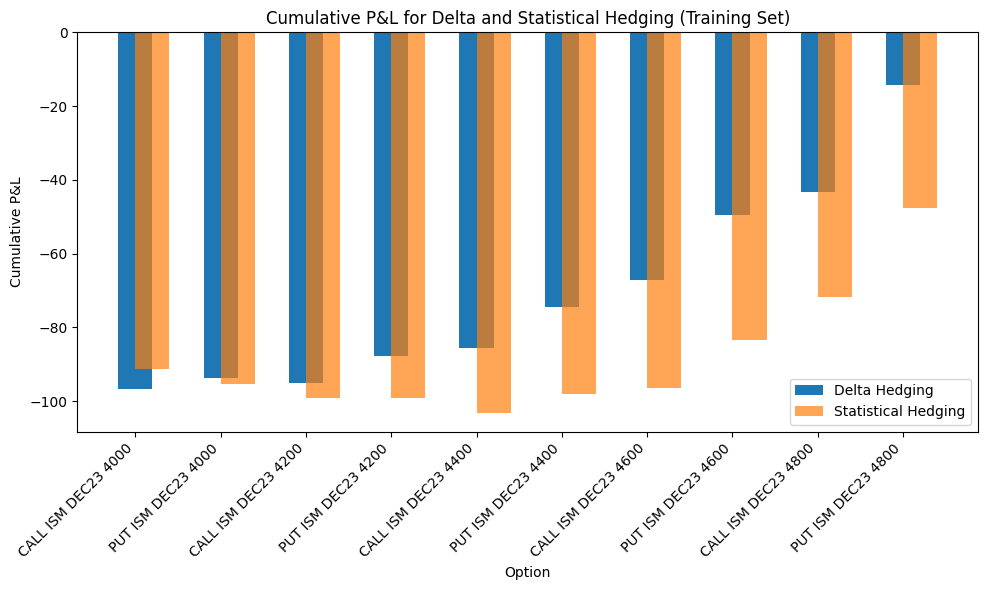

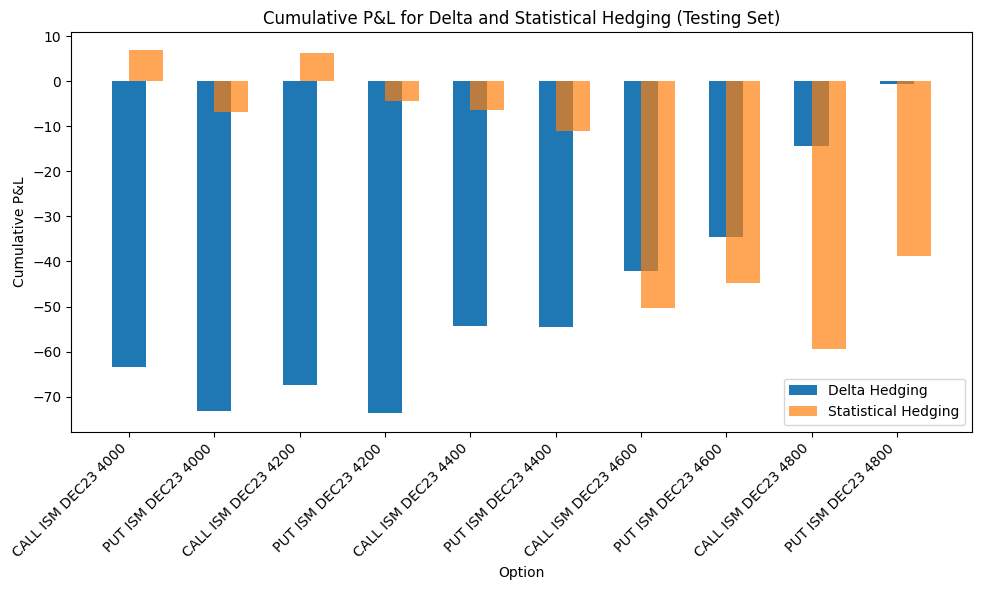

In [ ]:
# Function to plot the comparison between delta hedging and statistical hedging
def plot_comparison(pnl_delta, pnl_stat, dataset_name=''):
    plt.figure(figsize=(10, 6))

    # Plot the P&L for each option for both delta and statistical hedging
    plt.bar(range(len(pnl_delta)), list(pnl_delta.values()), width=0.4, label='Delta Hedging', align='center')
    plt.bar(range(len(pnl_stat)), list(pnl_stat.values()), width=0.4, label='Statistical Hedging', align='edge', alpha=0.7)

    # Set the labels for the plot
    plt.xticks(range(len(pnl_delta)), list(pnl_delta.keys()), rotation=45, ha='right')
    plt.xlabel('Option')
    plt.ylabel('Cumulative P&L')
    plt.title(f'Cumulative P&L for Delta and Statistical Hedging ({dataset_name} Set)')
    plt.legend()
    plt.tight_layout()

    plt.show()

# Plotting the P&L comparison for the training set
plot_comparison(pnl_delta_hedging_train, pnl_stat_hedging_train, 'Training')

# Plotting the P&L comparison for the testing set
plot_comparison(pnl_delta_hedging_test, pnl_stat_hedging_test, 'Testing')


### **Final Considerations**
By visually comparing the Delta Hedging P&L and the Statistical Hedging P&L, we observe that the Statistical Hedging generally underperforms compared to Delta Hedging in the training set.

However, when applied to the testing data, Statistical Hedging shows improved performance, particularly for strikes below 4600, where it outperforms Delta Hedging.

Despite struggling with higher-strike options, Statistical Hedging demonstrates overall superiority, indicating that it can offer more effective risk management in certain market conditions.


## **LSTM on the Daily Variation**

In the following section we explore the implementation of an LSTM Neural Network. The idea is to calculate the change of the options prices based on the underlying and adjusting the underlying on a daily basis.

We assume a markov structure of the data, meaning that we consider a form of conditional independence between the option prices we are dealing with once we have the underlying up to the previous period.
Thus far we have operated by linking y and x in the following manner:
$$ y_{t} - y_{t-1} = \Delta_{t-1} (x_{t} - x_{t-1}) $$
where we can simplify
$$  y_{t} - y_{t-1} = \tilde{y}_t $$
$$ x_{t} - x_{t-1} = \tilde{x}_t $$
We can rewrite the previous model as:
$$ \tilde{y}_t = \Delta_{t-1} (\tilde{x}_t) $$
Meaning that in order to compensate for the variation of y on x we would want to forecast $ \Delta_t $, given all the data we have, such as the prices of both the underlying and the derivative, the deltas and the gammas.
Thus far, again, we have worked by using the $\Delta_{t-1}$ in order to adjust the hedging ratio $ \bar{\Delta_{t}} $
We therefore train the model to predict this new ratio:
$$ \frac{\tilde{y}_t}{\tilde{x}_t}   =   \bar{\Delta_{t}} $$

So using the actual Delta used in Delta hedging, the real Gamma, the Option prices and the Underlying, using daily data, we compute it.



 We begin by defining the previously defined variables in order to set a checkpoint for this second approach.



In [ ]:
date_column = 'Date'
futures_price_column = 'CME-MINI S&P 500 INDEX DEC 2023 - SETT. PRICE'
continuous_futures_price_column = 'CME-MINI S&P 500 INDEX CONT. - SETT. PRICE'

price_columns = [
    'CALL ISM DEC23 4000',
    'PUT ISM DEC23 4000',
    'CALL ISM DEC23 4200',
    'PUT ISM DEC23 4200',
    'CALL ISM DEC23 4400',
    'PUT ISM DEC23 4400',
    'CALL ISM DEC23 4600',
    'PUT ISM DEC23 4600',
    'CALL ISM DEC23 4800',
    'PUT ISM DEC23 4800'
]

delta_columns = [
    'CALL ISM DEC23 4000 - OPTION DELTA',
    'PUT ISM DEC23 4000 - OPTION DELTA',
    'CALL ISM DEC23 4200 - OPTION DELTA',
    'PUT ISM DEC23 4200 - OPTION DELTA',
    'CALL ISM DEC23 4400 - OPTION DELTA',
    'PUT ISM DEC23 4400 - OPTION DELTA',
    'CALL ISM DEC23 4600 - OPTION DELTA',
    'PUT ISM DEC23 4600 - OPTION DELTA',
    'CALL ISM DEC23 4800 - OPTION DELTA',
    'PUT ISM DEC23 4800 - OPTION DELTA'
]

gamma_columns = [
    'CALL ISM DEC23 4000 - OPTION GAMMA',
    'PUT ISM DEC23 4000 - OPTION GAMMA',
    'CALL ISM DEC23 4200 - OPTION GAMMA',
    'PUT ISM DEC23 4200 - OPTION GAMMA',
    'CALL ISM DEC23 4400 - OPTION GAMMA',
    'PUT ISM DEC23 4400 - OPTION GAMMA',
    'CALL ISM DEC23 4600 - OPTION GAMMA',
    'PUT ISM DEC23 4600 - OPTION GAMMA',
    'CALL ISM DEC23 4800 - OPTION GAMMA',
    'PUT ISM DEC23 4800 - OPTION GAMMA'
]



### **Preprocessing**

We begin by creating a new dataset containing the differentials to achieve the ratio we were discussing before.

In [ ]:
diff_df = pd.DataFrame()
new_opt_cols = []

for horizontal_idx in price_columns:
  column_name = horizontal_idx + "DIFF"
  diff_df[column_name] = data[horizontal_idx].diff()
  diff_df[column_name] = diff_df[column_name].fillna(0)
  new_opt_cols.append(column_name)


diff_df[delta_columns] = data[delta_columns].shift(1).fillna(0).copy()
diff_df[gamma_columns] = data[gamma_columns].shift(1).fillna(0).copy()
price_col_diff = futures_price_column + "_diff"
diff_df[price_col_diff] = data[futures_price_column].diff().fillna(0)

In [ ]:
opt_ratios = []

for col in new_opt_cols:
  column_name = col + "_ratio"
  diff_df[column_name] = diff_df[col]/diff_df[price_col_diff]
  diff_df[column_name] = diff_df[column_name].fillna(0)
  opt_ratios.append(column_name)


In [ ]:
Xtrain = diff_df.iloc[:300, :].copy().values
ytrain = diff_df.iloc[:300,:].copy()
Xtest = diff_df.iloc[300:,:].copy().values
ytest = diff_df.iloc[300:,:].copy()
ytrain = ytrain[opt_ratios].values
ytest = ytest[opt_ratios].values
Xtrain.T

array([[  0.        , -16.        ,  70.25      , ..., -13.5       ,
         50.25      ,  22.5       ],
       [  0.        ,   3.75      , -39.75      , ...,   2.75      ,
        -29.75      , -11.5       ],
       [  0.        , -16.25      ,  63.25      , ..., -12.        ,
         41.5       ,  18.75      ],
       ...,
       [  0.        ,  -0.2875    ,  -0.54241071, ...,  -0.64179104,
         -0.78287462,  -0.74820144],
       [  0.        ,   0.5625    ,   0.36830357, ...,   0.10447761,
          0.0733945 ,   0.09352518],
       [  0.        ,  -0.4125    ,  -0.62053571, ...,  -0.91044776,
         -0.9235474 ,  -0.89928058]])

In [ ]:
Xtrain[np.isinf(Xtrain)] = 20
Xtrain[np.isneginf(Xtrain)] = -20
ytrain[np.isinf(ytrain)] = 20
ytrain[np.isneginf(ytrain)] = -20

print("NaNs in Xtrain:", np.isnan(Xtrain).any())
print("Infs in Xtrain:", np.isinf(Xtrain).any())
print("NaNs in ytrain:", np.isnan(ytrain).any())
print("Infs in ytrain:", np.isinf(ytrain).any())
print("Infs in ytrain:", np.isneginf(Xtrain).any())
print("Infs in ytrain:", np.isneginf(ytrain).any())

NaNs in Xtrain: False
Infs in Xtrain: False
NaNs in ytrain: False
Infs in ytrain: False
Infs in ytrain: False
Infs in ytrain: False


We change the shape as LSTM requires the indication of a timestep, in our case, given the Markovian assumption of the data, we consider a daily timestep of 1. Therefore the shape will be of 300 observations, 1 timestep and 41 features.

In [ ]:
Xtrain_reshaped = Xtrain.reshape((Xtrain.shape[0], 1, Xtrain.shape[1]))

### **Model Training**

Furthermore, given how small the data is, the numerical instability is high. As you can see, in the previous cells we used a discretionary value for the ratio between the differeneces of the options and the underlying diverges towards infinity or negative infinity. The ratio of 20 is great and it will disappear when we will normalize the data in the first layer of our model.

Given the numerical instability we use a very small learning rate in order to advanced towards the global minimum of the loss function slowly. This stabilizes the gradient descent, since Adam is based on a Stochastic Gradient Descent. The smaller learning rate helps also overcome the randomness of the starting position of the gradient descent.

We also use the early stopping method in order to avoid overfitting and we revert back the best weights once the early stopping is activated. In order to debug the NN we used TensorBoard, as initially we did not notice the  numerical instability.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, BatchNormalization,  Dropout, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam


input_shape = (1, 41)
output_shape = 10

model3 = Sequential([
    BatchNormalization(input_shape=input_shape),
    Bidirectional(LSTM(200, return_sequences=True)),
    Dropout(0.2),
    LSTM(100, return_sequences=False),
    Dropout(0.2),
    Dense(200, activation='relu'),
    Dense(output_shape, activation='linear')
])

learning_rate = 0.0001
optimizer = Adam(learning_rate=learning_rate)
model3.compile(optimizer=optimizer, loss='mse')
early_stopper = EarlyStopping(
    monitor='loss',     # metric to monitor
    min_delta=0.001,        # minimum change detected as an improvement
    patience=10,            # number of epochs with no improvement after which training will be stopped
    verbose=1,
    mode='min',             # minimize loss (of course)
    restore_best_weights=True  # restores model weights from the epoch with the best value of the monitored quantity.
)
checkpoint_cb =  ModelCheckpoint("my_checkpoints", save_weights_only = True) #redundancy just in case

model3.summary()


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_4 (Bat  (None, 1, 41)             164       
 chNormalization)                                                
                                                                 
 bidirectional_4 (Bidirecti  (None, 1, 400)            387200    
 onal)                                                           
                                                                 
 dropout_12 (Dropout)        (None, 1, 400)            0         
                                                                 
 lstm_9 (LSTM)               (None, 100)               200400    
                                                                 
 dropout_13 (Dropout)        (None, 100)               0         
                                                                 
 dense_18 (Dense)            (None, 200)              

Given that the LSTM is Bidirectional ( it evaluates back and forward dependencies among variables ) the "neurons" in each layer appear to have doubled.

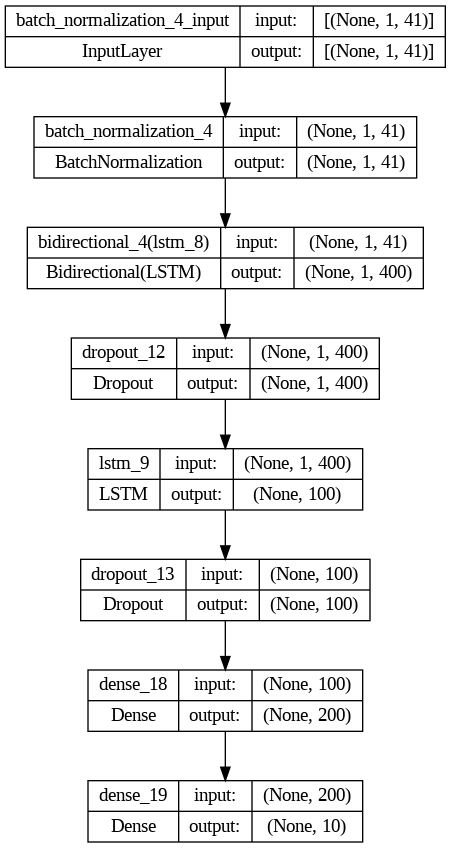

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model3, show_shapes=True, show_layer_names=True)

In [ ]:
%pip install -q -U tensorboard-plugin-profile

In [ ]:
from pathlib import Path
from time import strftime

def get_run_logdir(root_logdir = "my_logs"):
  return Path(root_logdir) / strftime("run_%Y_%m_%d_%H_%M_%S")

run_logdir = get_run_logdir()

In [ ]:
import tensorflow as tf
tensorboard_cb = tf.keras.callbacks.TensorBoard(run_logdir, profile_batch=(100,200))

In [ ]:
%reload_ext tensorboard
%tensorboard --logdir=./my_logs --host localhost --port 6066

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
history = model3.fit(Xtrain_reshaped, ytrain, epochs=1000, batch_size=32, verbose=1, callbacks=[early_stopper,checkpoint_cb, tensorboard_cb])

Epoch 1/1000
10/10 [==============================] - 38s 233ms/step - loss: 3.5520
Epoch 2/1000
10/10 [==============================] - 2s 164ms/step - loss: 3.5355
Epoch 3/1000
10/10 [==============================] - 2s 193ms/step - loss: 3.5206
Epoch 4/1000
10/10 [==============================] - 1s 121ms/step - loss: 3.5049
Epoch 5/1000
10/10 [==============================] - 1s 112ms/step - loss: 3.4823
Epoch 6/1000
10/10 [==============================] - 1s 115ms/step - loss: 3.4746
Epoch 7/1000
10/10 [==============================] - 1s 110ms/step - loss: 3.4552
Epoch 8/1000
10/10 [==============================] - 1s 121ms/step - loss: 3.4285
Epoch 9/1000
10/10 [==============================] - 1s 116ms/step - loss: 3.4005
Epoch 10/1000
10/10 [==============================] - 1s 126ms/step - loss: 3.3600
Epoch 11/1000
10/10 [==============================] - 1s 101ms/step - loss: 3.3304
Epoch 12/1000
10/10 [==============================] - 1s 75ms/step - loss: 3.2679
E

In [ ]:
# model3.save('model3.h5')

In [ ]:
model3.predict(Xtrain_reshaped).T

10/10 [==============================] - 5s 11ms/step


array([[ 0.3110439 ,  0.43134153,  0.6698497 , ...,  0.38181034,
         0.5368654 ,  0.3962142 ],
       [-0.18213814, -0.33677468, -0.44998986, ..., -0.4078611 ,
        -0.4541949 , -0.35116985],
       [ 0.23661895,  0.33351418,  0.5993945 , ...,  0.34255096,
         0.43321317,  0.3249593 ],
       ...,
       [-0.29000282, -0.62226117, -0.70157695, ..., -0.6982067 ,
        -0.7350117 , -0.594013  ],
       [ 0.06696407,  0.12357613,  0.27617207, ...,  0.07083583,
         0.16079661,  0.0953501 ],
       [-0.37871394, -0.6739527 , -0.76502806, ..., -0.7917926 ,
        -0.83241975, -0.68281996]], dtype=float32)

### *Load the Model in case you wish*



In [ ]:
# from tensorflow.keras.models import load_model
# model = load_model('model3.h5')

In [ ]:
Xtest[np.isinf(Xtest)] = 20
Xtest[np.isneginf(Xtest)] = -20
ytest[np.isinf(ytest)] = 20
ytest[np.isneginf(ytest)] = -20
Xtest_reshaped = Xtest.reshape((Xtest.shape[0], 1, Xtest.shape[1]))

In [ ]:
y_pred_train = model3.predict(Xtrain_reshaped)
y_pred_test = model3.predict(Xtest_reshaped)

6/6 [==============================] - 0s 11ms/step


### **Plot the residuals**

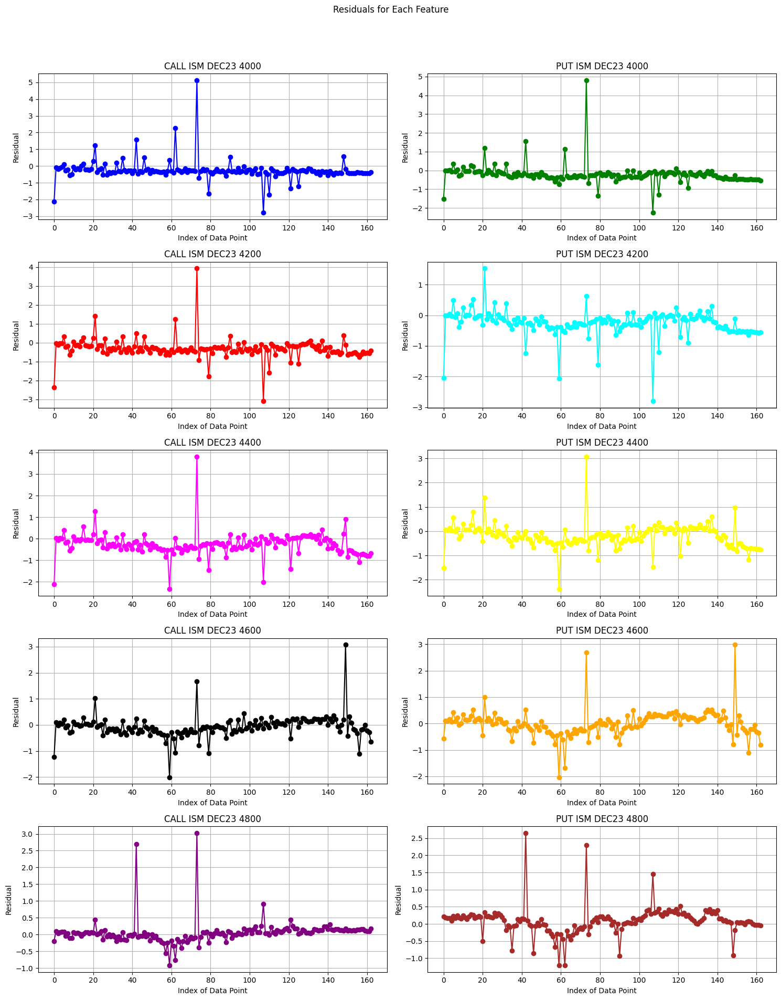

In [ ]:
residuals = y_pred_test - ytest

fig, axes = plt.subplots(5, 2, figsize=(15, 20))
fig.suptitle('Residuals for Each Feature')

colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange', 'purple', 'brown']

for i in range(10):
    ax = axes[i // 2, i % 2]
    ax.plot(residuals[:, i], marker='o', linestyle='-', color=colors[i])
    ax.set_title(f'{price_columns[i]}')
    ax.set_xlabel('Index of Data Point')
    ax.set_ylabel('Residual')
    ax.grid(True)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [ ]:
dfpred_train = pd.DataFrame(y_pred_train, columns=[opt_ratios])
dfpred_test = pd.DataFrame(y_pred_test, columns=[opt_ratios])

In [ ]:
dfytest = diff_df.iloc[300:,:].copy()
dfytest = dfytest[opt_ratios]
Xtest_df  = pd.DataFrame(Xtest, columns=diff_df.columns)
localdata=data.iloc[300:,:].copy().reset_index()

### **Result Comparison and Visualization**


In [ ]:
def calc_pnl_stat(data, dfratios, opt_ratios, futures_price_column, price_columns):
    pnl_dict = {}
    underlying_price_diff = data[futures_price_column].diff().fillna(0)
    underlying_price_diff = underlying_price_diff[300:].copy().reset_index()
    localdata = data.iloc[300:,:].copy().reset_index()

    for idx, opt_r in enumerate(opt_ratios):
        hedge_ratio = dfratios[opt_r].shift(1).fillna(0).squeeze()
        current = price_columns[idx]
        pnl = localdata[current].diff().fillna(0).squeeze() - (hedge_ratio*underlying_price_diff.iloc[:,1])
        pnl_dict[current] = pnl.sum()

    return pnl_dict

pnlstat = calc_pnl_stat(data, dfpred_test, opt_ratios, futures_price_column, price_columns)
train_data = data.iloc[:300]
test_data = data.iloc[299:] #Per far funzionare la funzione calculate_pnl_stastical_hedging, il test set necessita di partire dall'ultima osservazione del train set

def calculate_pnl_delta_hedging(data, delta_columns, futures_price_column, price_columns):
    pnl_dict = {}
    underlying_price_diff = data[futures_price_column].diff().fillna(0)

    for idx, delta_col in enumerate(delta_columns):
        hedge_ratio = data[delta_col].shift(1)
        pnl = data[price_columns[idx]].diff().fillna(0) - (hedge_ratio * underlying_price_diff)
        pnl_dict[price_columns[idx]] = pnl.sum()

    return pnl_dict

In [ ]:
def calc_pnl_stat(data, dfratios, opt_ratios, futures_price_column, price_columns):
    pnl_dict = {}
    underlying_price_diff = data[futures_price_column].diff().fillna(0)
    underlying_price_diff = underlying_price_diff[300:].copy().reset_index()
    localdata = data.iloc[300:,:].copy().reset_index()

    for idx, opt_r in enumerate(opt_ratios):
        hedge_ratio = dfratios[opt_r].shift(1).fillna(0).squeeze()
        current = price_columns[idx]
        pnl = localdata[current].diff().fillna(0).squeeze() - (hedge_ratio*underlying_price_diff.iloc[:,1])
        pnl_dict[current] = pnl.sum()

    return pnl_dict

pnlstat = calc_pnl_stat(data, dfpred_test, opt_ratios, futures_price_column, price_columns)
train_data = data.iloc[:300]
test_data = data.iloc[299:]

def calculate_pnl_delta_hedging(data, delta_columns, futures_price_column, price_columns):
    pnl_dict = {}
    underlying_price_diff = data[futures_price_column].diff().fillna(0)

    for idx, delta_col in enumerate(delta_columns):
        hedge_ratio = data[delta_col].shift(1)
        pnl = data[price_columns[idx]].diff().fillna(0) - (hedge_ratio * underlying_price_diff)
        pnl_dict[price_columns[idx]] = pnl.sum()

    return pnl_dict

In [ ]:
pnlstat = calc_pnl_stat(data, dfpred_test, opt_ratios, futures_price_column, price_columns)
pnl_delta_hedging_test = calculate_pnl_delta_hedging(test_data, delta_columns, futures_price_column, price_columns)

In [ ]:
def compare_hedging_results(pnl_delta, pnl_stat, dataset_name=''):
    delta_hedging_sum = sum(pnl_delta.values())
    stat_hedging_sum = sum(pnl_stat.values())

    print(f'P&L for Delta Hedging on {dataset_name} Set: {delta_hedging_sum:.2f}')
    print(f'P&L for Statistical Hedging on {dataset_name} Set: {stat_hedging_sum:.2f}')
    print(f'Difference: {stat_hedging_sum - delta_hedging_sum:.2f}')

compare_hedging_results(pnl_delta_hedging_test, pnlstat, 'Testing')


P&L for Delta Hedging on Testing Set: -478.38
P&L for Statistical Hedging on Testing Set: 972.18
Difference: 1450.56


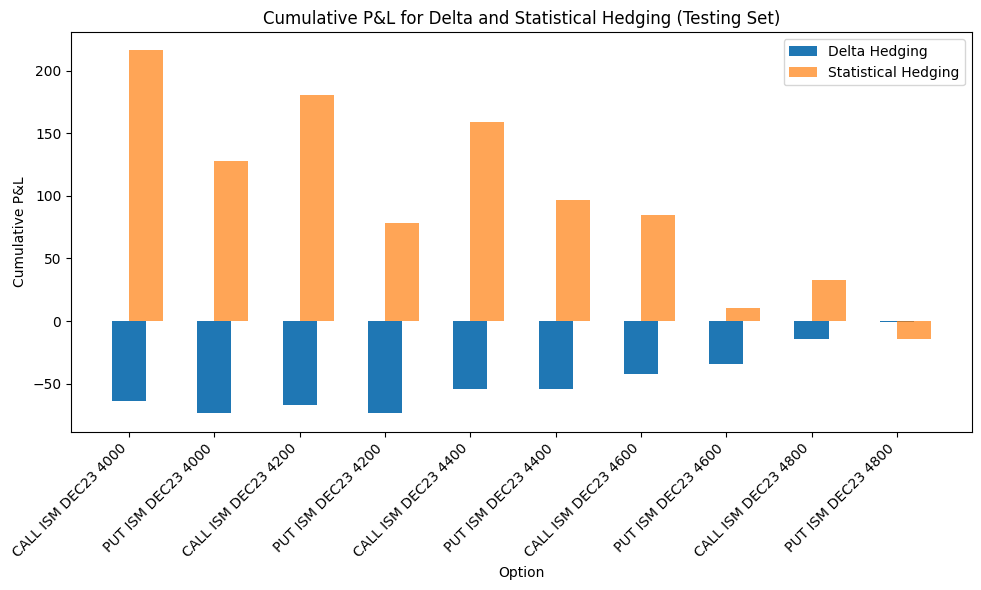

In [ ]:
import matplotlib.pyplot as plt

def plot_comparison(pnl_delta, pnl_stat, dataset_name=''):
    plt.figure(figsize=(10, 6))

    plt.bar(range(len(pnl_delta)), list(pnl_delta.values()), width=0.4, label='Delta Hedging', align='center')
    plt.bar(range(len(pnl_stat)), list(pnl_stat.values()), width=0.4, label='Statistical Hedging', align='edge', alpha=0.7)

    plt.xticks(range(len(pnl_delta)), list(pnl_delta.keys()), rotation=45, ha='right')
    plt.xlabel('Option')
    plt.ylabel('Cumulative P&L')
    plt.title(f'Cumulative P&L for Delta and Statistical Hedging ({dataset_name} Set)')
    plt.legend()
    plt.tight_layout()

    plt.show()

plot_comparison(pnl_delta_hedging_test, pnlstat, 'Testing')

What we can see from the P&L comparison and from the plot is that the new Statistical Hedging strategy gives us as a bigger profit than the Delta Hedging strategy, but this is not what we aimed for as we wanted a close to zero P&L to reduce its variability.

## **LSTM on the Option Deltas**

In the following section we explore the implementation of another LSTM Neural Network.

In this case, the target variable is represented by the delta values of the options, which can be seen as proxies of the hedge ratios according to a Delta-Hedging strategy.

Moreover, the X matrix is constitued by the option gammas, by the options moneyness and by the time to maturity.


### **Preprocessing**
We loaded the Excel file to obtain the necessary data, such as dates, futures prices, and option prices, for training and testing the model. The names of the option price columns and delta columns are stored in lists for easier reference.

Moreover, we create the moneyness and time to maturity columns.

In [ ]:
excel_path= '/content/drive/MyDrive/Proj_Fintech/takehome20902data.xlsx'
data = pd.read_excel(excel_path, sheet_name=1)

In [ ]:
date_column = 'Date'
futures_price_column = 'CME-MINI S&P 500 INDEX DEC 2023 - SETT. PRICE'
continuous_futures_price_column = 'CME-MINI S&P 500 INDEX CONT. - SETT. PRICE'

price_columns = [
    'CALL ISM DEC23 4000',
    'PUT ISM DEC23 4000',
    'CALL ISM DEC23 4200',
    'PUT ISM DEC23 4200',
    'CALL ISM DEC23 4400',
    'PUT ISM DEC23 4400',
    'CALL ISM DEC23 4600',
    'PUT ISM DEC23 4600',
    'CALL ISM DEC23 4800',
    'PUT ISM DEC23 4800'
]

delta_columns = [
    'CALL ISM DEC23 4000 - OPTION DELTA',
    'PUT ISM DEC23 4000 - OPTION DELTA',
    'CALL ISM DEC23 4200 - OPTION DELTA',
    'PUT ISM DEC23 4200 - OPTION DELTA',
    'CALL ISM DEC23 4400 - OPTION DELTA',
    'PUT ISM DEC23 4400 - OPTION DELTA',
    'CALL ISM DEC23 4600 - OPTION DELTA',
    'PUT ISM DEC23 4600 - OPTION DELTA',
    'CALL ISM DEC23 4800 - OPTION DELTA',
    'PUT ISM DEC23 4800 - OPTION DELTA'
]

gamma_columns = [
    'CALL ISM DEC23 4000 - OPTION GAMMA',
    'PUT ISM DEC23 4000 - OPTION GAMMA',
    'CALL ISM DEC23 4200 - OPTION GAMMA',
    'PUT ISM DEC23 4200 - OPTION GAMMA',
    'CALL ISM DEC23 4400 - OPTION GAMMA',
    'PUT ISM DEC23 4400 - OPTION GAMMA',
    'CALL ISM DEC23 4600 - OPTION GAMMA',
    'PUT ISM DEC23 4600 - OPTION GAMMA',
    'CALL ISM DEC23 4800 - OPTION GAMMA',
    'PUT ISM DEC23 4800 - OPTION GAMMA'
]



In [ ]:
strikes = [4000,4000,4200,4200,4400,4400,4600,4600,4800,4800]
moneyness_columns=[]

[col for col in data.columns if 'Option P&L' in col]

for idx, price_col in enumerate(price_columns):
    strike_price = strikes[idx]
    if 'CALL' in price_col:
        moneyness = data[futures_price_column]/strike_price #if the option is a CALL, moneyness is given by underlying/strike
    else:
        moneyness=strike_price/data[futures_price_column] #if the option is a PUT, moneyness is given by strike/underlying
    column_name = price_col + ' - MONEYNESS'
    data[column_name]=moneyness
    moneyness_columns.append(column_name)

print(moneyness_columns)

['CALL ISM DEC23 4000 - MONEYNESS', 'PUT ISM DEC23 4000 - MONEYNESS', 'CALL ISM DEC23 4200 - MONEYNESS', 'PUT ISM DEC23 4200 - MONEYNESS', 'CALL ISM DEC23 4400 - MONEYNESS', 'PUT ISM DEC23 4400 - MONEYNESS', 'CALL ISM DEC23 4600 - MONEYNESS', 'PUT ISM DEC23 4600 - MONEYNESS', 'CALL ISM DEC23 4800 - MONEYNESS', 'PUT ISM DEC23 4800 - MONEYNESS']


In [ ]:
from datetime import datetime
expiry_date = datetime(2023,12,15)
ttm = pd.Series(((expiry_date-data['Date']).dt.days)/365)

data['Time_to_maturity']=ttm
ttm_column = 'Time_to_maturity'

In [ ]:
diff_df = pd.DataFrame()
new_opt_cols = []

for horizontal_idx in price_columns:
  column_name = horizontal_idx + " - DIFF"
  diff_df[column_name] = data[horizontal_idx].diff()
  diff_df[column_name] = diff_df[column_name].fillna(0)
  new_opt_cols.append(column_name)

diff_df[delta_columns] = data[delta_columns].shift(1).fillna(0).copy()
diff_df[gamma_columns] = data[gamma_columns].shift(1).fillna(0).copy()
diff_df[moneyness_columns]=data[moneyness_columns]
diff_df[ttm_column]=data[ttm_column]
underlying_col_diff = futures_price_column + " - DIFF"
diff_df[underlying_col_diff] = data[futures_price_column].diff().fillna(0)

In [ ]:
opt_ratios = []

for col in new_opt_cols:
  column_name = col + " - RATIO"
  diff_df[column_name] = diff_df[col]/diff_df[underlying_col_diff]
  diff_df[column_name] = diff_df[column_name].fillna(0)
  opt_ratios.append(column_name)


In [ ]:
X = diff_df[[underlying_col_diff]+moneyness_columns+gamma_columns+[ttm_column]].copy().values
Xtrain = X[:300,:]
Xtest = X[300:,:]
y = diff_df[delta_columns].copy().values
ytrain = y[:300,:]
ytest = y[300:,:]

In [ ]:
print("NaNs in Xtrain:", np.isnan(Xtrain).any())
print("Infs in Xtrain:", np.isinf(Xtrain).any())
print("NaNs in ytrain:", np.isnan(ytrain).any())
print("Infs in ytrain:", np.isinf(ytrain).any())
print("Infs in ytrain:", np.isneginf(Xtrain).any())
print("Infs in ytrain:", np.isneginf(ytrain).any())

NaNs in Xtrain: False
Infs in Xtrain: False
NaNs in ytrain: False
Infs in ytrain: False
Infs in ytrain: False
Infs in ytrain: False


In [ ]:
Xtrain_reshaped = Xtrain.reshape((Xtrain.shape[0], 1, Xtrain.shape[1]))

### **Model Training**

Given the numerical instability we use a very small learning rate in order to advanced towards the global minimum of the loss function slowly. This stabilizes the gradient descent, since Adam is based on a Stochastic Gradient Descent. The smaller learning rate helps also overcome the randomness of the starting position of the gradient descent.

We also use the early stopping method in order to avoid overfitting and we revert back the best weights once the early stopping is activated. In order to debug the NN we used TensorBoard, as initially we did not notice the  numerical instability.

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, BatchNormalization,  Dropout, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam

input_shape = (1, 22)
output_shape = 10

model = Sequential([
    BatchNormalization(input_shape=input_shape),
    Bidirectional(LSTM(200, return_sequences=True)),
    Dropout(0.2),
    LSTM(100, return_sequences=False),
    Dropout(0.2),
    Dense(200, activation='relu'),
    Dense(output_shape, activation='linear')
])

learning_rate = 0.0001
optimizer = Adam(learning_rate=learning_rate)
model.compile(optimizer=optimizer, loss='mse')
early_stopper = EarlyStopping(
    monitor='loss',     # Metric to monitor
    min_delta=0.001,        # Minimum change detected as an improvement
    patience=10,            # Number of epochs with no improvement after which training will be stopped
    verbose=1,              # To log the progress
    mode='min',             # Minimize loss
    restore_best_weights=True  # Restores model weights from the epoch with the best value of the monitored quantity.
)
checkpoint_cb =  ModelCheckpoint("my_checkpoints", save_weights_only = True)

model.summary()


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization_5 (Bat  (None, 1, 22)             88        
 chNormalization)                                                
                                                                 
 bidirectional_5 (Bidirecti  (None, 1, 400)            356800    
 onal)                                                           
                                                                 
 dropout_14 (Dropout)        (None, 1, 400)            0         
                                                                 
 lstm_11 (LSTM)              (None, 100)               200400    
                                                                 
 dropout_15 (Dropout)        (None, 100)               0         
                                                                 
 dense_20 (Dense)            (None, 200)              

Given that the LSTM is Bidirectional (it evaluates back and forward dependencies among variables) the "neurons" in each layer appear to have doubled.

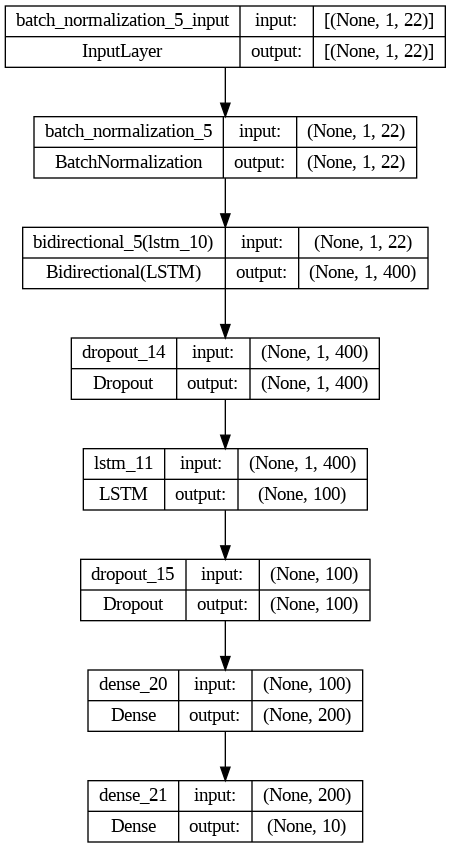

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
history = model.fit(Xtrain_reshaped, ytrain, epochs=1000, batch_size=32, verbose=1, callbacks=[early_stopper,checkpoint_cb])

Epoch 1/1000
10/10 [==============================] - 19s 110ms/step - loss: 0.2682
Epoch 2/1000
10/10 [==============================] - 1s 94ms/step - loss: 0.2605
Epoch 3/1000
10/10 [==============================] - 1s 79ms/step - loss: 0.2525
Epoch 4/1000
10/10 [==============================] - 1s 58ms/step - loss: 0.2429
Epoch 5/1000
10/10 [==============================] - 1s 52ms/step - loss: 0.2318
Epoch 6/1000
10/10 [==============================] - 1s 52ms/step - loss: 0.2183
Epoch 7/1000
10/10 [==============================] - 0s 50ms/step - loss: 0.2018
Epoch 8/1000
10/10 [==============================] - 0s 50ms/step - loss: 0.1832
Epoch 9/1000
10/10 [==============================] - 0s 49ms/step - loss: 0.1612
Epoch 10/1000
10/10 [==============================] - 1s 53ms/step - loss: 0.1381
Epoch 11/1000
10/10 [==============================] - 1s 89ms/step - loss: 0.1166
Epoch 12/1000
10/10 [==============================] - 1s 93ms/step - loss: 0.1021
Epoch 13/10

In [ ]:
#model.save('model.h5')

In [ ]:
model.predict(Xtrain_reshaped).T

10/10 [==============================] - 3s 11ms/step


array([[ 0.43474355,  0.4314186 ,  0.47246617, ...,  0.62462944,
         0.6724952 ,  0.67215544],
       [-0.2443904 , -0.24269103, -0.27811038, ..., -0.39432225,
        -0.4214549 , -0.39554706],
       [ 0.38253766,  0.3805622 ,  0.4140023 , ...,  0.5027929 ,
         0.5280728 ,  0.5252756 ],
       ...,
       [-0.4255581 , -0.42351207, -0.47446996, ..., -0.7658199 ,
        -0.812937  , -0.7687548 ],
       [ 0.21010287,  0.20654209,  0.22526667, ...,  0.17149103,
         0.17420869,  0.16485158],
       [-0.46880326, -0.4683874 , -0.5129826 , ..., -0.8791266 ,
        -0.94769096, -0.90439683]], dtype=float32)

### *Load the Model in case you wish*

In [ ]:
# from tensorflow.keras.models import load_model
# model = load_model('model.h5')

In [ ]:
Xtest_reshaped = Xtest.reshape((Xtest.shape[0], 1, Xtest.shape[1]))
y_pred = model.predict(Xtest_reshaped)

6/6 [==============================] - 0s 13ms/step


### **Plot the residuals**

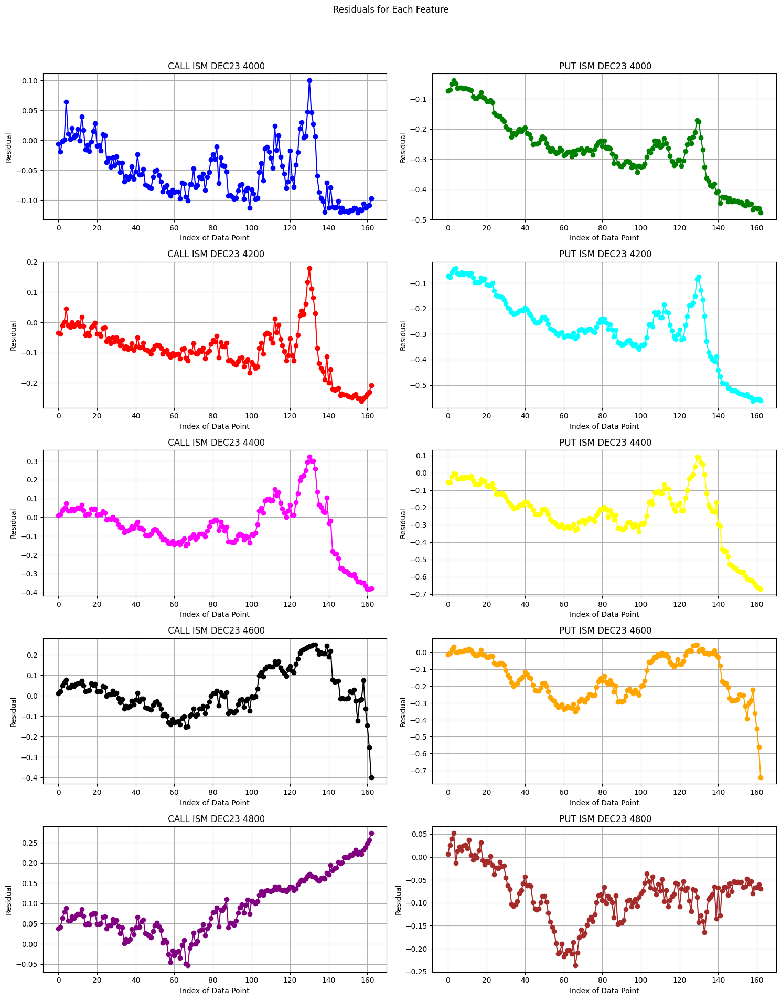

In [ ]:
residuals = y_pred - ytest

# Create a figure and axes for the subplots
fig, axes = plt.subplots(5, 2, figsize=(15, 20))  # Adjust subplot grid if needed
fig.suptitle('Residuals for Each Feature')

colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black', 'orange', 'purple', 'brown']

# Plotting the residuals for each feature
for i in range(10):
    ax = axes[i // 2, i % 2]  # Determine the position of the subplot
    ax.plot(residuals[:, i], marker='o', linestyle='-', color=colors[i])
    ax.set_title(f' {price_columns[i]}')
    ax.set_xlabel('Index of Data Point')
    ax.set_ylabel('Residual')
    ax.grid(True)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout to make room for the main title
plt.show()

In [ ]:
dfpred = pd.DataFrame(y_pred, columns=[delta_columns])


In [ ]:
datacolumns = diff_df[[underlying_col_diff]+moneyness_columns+gamma_columns+[ttm_column]].columns
Xtest_df  = pd.DataFrame(Xtest, columns=datacolumns)

### **Result Comparison and Visualization**

In [ ]:
def calc_pnl_stat(data, dfratios, delta_columns, futures_price_column, price_columns):
    pnl_dict = {}
    underlying_price_diff = data[futures_price_column].diff().fillna(0)
    underlying_price_diff = underlying_price_diff[300:].copy().reset_index()
    localdata = data.iloc[300:,:].copy().reset_index()

    for idx, opt_r in enumerate(delta_columns):
        hedge_ratio = dfratios[opt_r].shift(1).fillna(0).squeeze()  # Hedge ratio given by delta
        current = price_columns[idx]
        pnl = localdata[current].diff().fillna(0).squeeze() - (hedge_ratio*underlying_price_diff.iloc[:,1])
        pnl_dict[current] = pnl.sum()  # P&L for each option

    return pnl_dict

pnlstat = calc_pnl_stat(data, dfpred, delta_columns, futures_price_column, price_columns)
train_data = data.iloc[:300]
test_data = data.iloc[299:] #Per far funzionare la funzione calculate_pnl_stastical_hedging, il test set necessita di partire dall'ultima osservazione del train set

def calculate_pnl_delta_hedging(data, delta_columns, futures_price_column, price_columns):
    pnl_dict = {}
    underlying_price_diff = data[futures_price_column].diff().fillna(0)

    for idx, delta_col in enumerate(delta_columns):
        hedge_ratio = data[delta_col].shift(1)
        pnl = data[price_columns[idx]].diff().fillna(0) - (hedge_ratio * underlying_price_diff)
        pnl_dict[price_columns[idx]] = pnl.sum()

    return pnl_dict

In [ ]:
pnlstat = calc_pnl_stat(data, dfpred, delta_columns, futures_price_column, price_columns)
pnl_delta_hedging_test = calculate_pnl_delta_hedging(test_data, delta_columns, futures_price_column, price_columns)

In [ ]:
def compare_hedging_results(pnl_delta, pnl_stat, dataset_name=''):
    delta_hedging_sum = sum(pnl_delta.values())
    stat_hedging_sum = sum(pnl_stat.values())

    print(f'P&L for Delta Hedging on {dataset_name} Set: {delta_hedging_sum:.2f}')
    print(f'P&L for Statistical Hedging on {dataset_name} Set: {stat_hedging_sum:.2f}')
    print(f'Difference: {stat_hedging_sum - delta_hedging_sum:.2f}')

compare_hedging_results(pnl_delta_hedging_test, pnlstat, 'Testing')

P&L for Delta Hedging on Testing Set: -478.38
P&L for Statistical Hedging on Testing Set: -125.85
Difference: 352.53


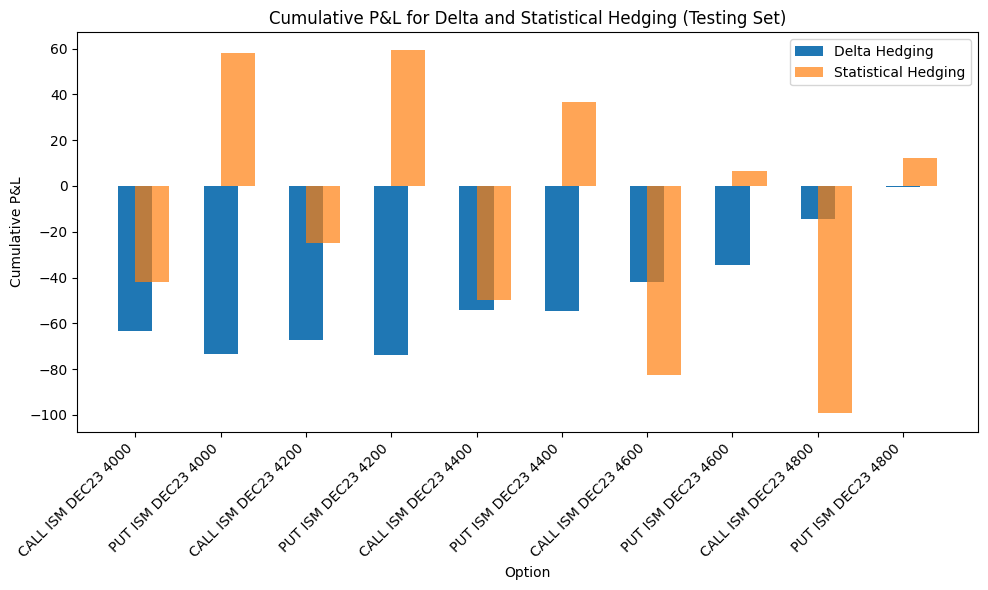

In [ ]:
import matplotlib.pyplot as plt

def plot_comparison(pnl_delta, pnl_stat, dataset_name=''):
    plt.figure(figsize=(10, 6))

    plt.bar(range(len(pnl_delta)), list(pnl_delta.values()), width=0.4, label='Delta Hedging', align='center')
    plt.bar(range(len(pnl_stat)), list(pnl_stat.values()), width=0.4, label='Statistical Hedging', align='edge', alpha=0.7)

    plt.xticks(range(len(pnl_delta)), list(pnl_delta.keys()), rotation=45, ha='right')
    plt.xlabel('Option')
    plt.ylabel('Cumulative P&L')
    plt.title(f'Cumulative P&L for Delta and Statistical Hedging ({dataset_name} Set)')
    plt.legend()
    plt.tight_layout()

    plt.show()

# Plotting the P&L comparison for the testing set
plot_comparison(pnl_delta_hedging_test, pnlstat, 'Testing')

### **Results**
What we can see from the P&L comparison and from the plot is that the new Statistical Hedging strategy performs way better than the Delta Hedging strategy.

Once more, it seems that the Statistical Hedging struggles with high-strike call options, while the situation improves for high-strike put options.

## **Dual-Branch Neural Network**

### **Preprocessing**

In [ ]:
import pandas as pd

excel_path = '/content/drive/MyDrive/Fintech20902_year_2024/takehome20902data.xlsx'
data = pd.read_excel(excel_path, sheet_name=1)

In [ ]:
import numpy as np
import statistics as st
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import random
import warnings

warnings.filterwarnings("ignore")

date_column = 'Date'
futures_price_column = 'CME-MINI S&P 500 INDEX DEC 2023 - SETT. PRICE'
continuous_futures_price_column = 'CME-MINI S&P 500 INDEX CONT. - SETT. PRICE'

data["Date"] = pd.to_datetime(data["Date"])

expiration = pd.to_datetime('2023-12-15')

data["Time"] = (expiration - data["Date"]).dt.days
data["Price"] = (data[futures_price_column]+data[continuous_futures_price_column])/2
data["cont_fut_change"] = data[continuous_futures_price_column].diff().shift(-1)

data["volatility_short"] = st.stdev(data["cont_fut_change"][1:32])
data["volatility_mid"] = st.stdev(data["cont_fut_change"][1:62])
data["volatility"] = st.stdev(data["cont_fut_change"][1:102])

for i in range(32,len(data)):
  data["volatility_short"][i] = st.stdev(data["cont_fut_change"][i-31:i-1])

for i in range(62,len(data)):
  data["volatility_mid"][i] = st.stdev(data["cont_fut_change"][i-61:i-1])

for i in range(102,len(data)):
  data["volatility"][i] = st.stdev(data["cont_fut_change"][i-101:i-1])

data["volatility_short_sq"] = data["volatility_short"]**2
data["volatility_mid_sq"] = data["volatility_mid"]**2
data["volatility_sq"] = data["volatility"]**2
data["volatility_short_sqrt"] = data["volatility_short"]**0.5
data["volatility_mid_sqrt"] = data["volatility_mid"]**0.5
data["volatility_sqrt"] = data["volatility"]**0.5
data["Time_sq"] = data["Time"]**2
data["Time_cub"] = data["Time"]**3
data["Time_sqrt"] = data["Time"]**0.5
data["Price_sq"] = data["Time"]**2
data["Price_cub"] = data["Time"]**3

### **Model Setup**

In [ ]:
price_columns = [
    'CALL ISM DEC23 4000',
    'PUT ISM DEC23 4000',
    'CALL ISM DEC23 4200',
    'PUT ISM DEC23 4200',
    'CALL ISM DEC23 4400',
    'PUT ISM DEC23 4400',
    'CALL ISM DEC23 4600',
    'PUT ISM DEC23 4600',
    'CALL ISM DEC23 4800',
    'PUT ISM DEC23 4800'
]

delta_columns = [
    'CALL ISM DEC23 4000 - OPTION DELTA',
    'PUT ISM DEC23 4000 - OPTION DELTA',
    'CALL ISM DEC23 4200 - OPTION DELTA',
    'PUT ISM DEC23 4200 - OPTION DELTA',
    'CALL ISM DEC23 4400 - OPTION DELTA',
    'PUT ISM DEC23 4400 - OPTION DELTA',
    'CALL ISM DEC23 4600 - OPTION DELTA',
    'PUT ISM DEC23 4600 - OPTION DELTA',
    'CALL ISM DEC23 4800 - OPTION DELTA',
    'PUT ISM DEC23 4800 - OPTION DELTA'
]

x_d = pd.DataFrame(data)[:-1]

x2_d = data[continuous_futures_price_column].diff().shift(-1)[:-1]
y_d = pd.DataFrame(data[price_columns]).diff().shift(-1)[:-1]

x_d = x_d.drop(columns=["Date"])

x2_d = np.repeat(x2_d.values, 10)
x2_d = pd.DataFrame(x2_d.reshape(462, 10))

n_steps_in, n_steps_out = 4, 1

x_d = x_d.values
x2_d = x2_d.values
y_d = y_d.values

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

scaler_minmax = MinMaxScaler()

scaler_minmax.fit(x_d)

x_norm = scaler_minmax.transform(x_d)


x, x2, y = list(), list(), list()

for i in range(462-n_steps_in):
    end_ix = i + n_steps_in
    seq_x, seq_x2, seq_y = x_norm[i:end_ix, :], x2_d[end_ix:end_ix+1, :], y_d[end_ix:end_ix+1, :]

    x.append(seq_x)
    x2.append(seq_x2)
    y.append(seq_y)

x = np.array(x)
x2 = np.array(x2)
y = np.array(y)

x = x.reshape(x.shape[0], -1)
x2 = x2.reshape(x2.shape[0], -1)
y = y.reshape(y.shape[0], -1)

random_numbers = random.sample(range(442), 300)

x_train = x[random_numbers]
x2_train = x2[random_numbers]
y_train = y[random_numbers]

x_test = np.delete(x, random_numbers, axis=0)
x2_test = np.delete(x2, random_numbers, axis=0)
y_test = np.delete(y, random_numbers, axis=0)

We now define our two branches Neural Network. The left branch has a tanh activation function while the right branch has a linear activation function. In this way we are able to model more complex functions.

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Input, Concatenate, Multiply
from tensorflow.keras import Model

m = x.shape[1]
n = x2.shape[1]

input_data = Input(shape=(m,), name='input_data')
change_future = Input(shape=(n,), name='change_future')

branch1 = Dense(84, activation='tanh', name='branch_tanh_a')(input_data)
branch2 = Dense(84, activation='linear', name='branch_linear_a')(input_data)
concatenated = Concatenate(name='concatenated')([branch1, branch2])
layer1 = Dense(128, activation='linear', name='layer1')(concatenated)
layer2 = Dense(32, activation='linear', name='layer2')(layer1)
hedge_ratio = Dense(10, activation='linear', name='hedge_ratio')(layer2)
portfolio = Multiply(name='portfolio')([hedge_ratio, change_future])

hedge = Model(inputs=[input_data, change_future], outputs=portfolio, name='Hedge')

hedge.compile(optimizer='adam', loss='mse')

In [ ]:
filepath = 'C:/Users/Tommaso/Desktop/Machine Learning ESS/model_checkpoint.keras'
saver = tf.keras.callbacks.ModelCheckpoint(
        filepath,
        monitor="loss",
        verbose=1,
        save_best_only=True,
        save_weights_only=False,
        mode="auto",
        save_freq="epoch",
        initial_value_threshold=None,
        )

In [ ]:
import tensorflow as tf
opt = tf.keras.optimizers.Adam(learning_rate=0.002)
hedge.compile(optimizer=opt, loss=tf.keras.losses.MeanSquaredError())

### **Model Training**

The objective of our Neural Network for each timestamp is to find the 10 deltas that, multiplied with the change in future quote, are closer to the change in the value of the options. The objective is therefore to close each day with a profit of 0.

In [ ]:
hedge.fit([x_train, x2_train], y_train,
                  validation_data=([x_test, x2_test], y_test),
                  epochs=150,
                  batch_size=60,
                  callbacks=saver,
                  verbose = True)

Epoch 1/150
1/5 [=====>........................] - ETA: 13s - loss: 3394.1379
Epoch 1: loss improved from inf to 2366.13208, saving model to C:/Users/Tommaso/Desktop/Machine Learning ESS/model_checkpoint.keras
5/5 [==============================] - 4s 138ms/step - loss: 2366.1321 - val_loss: 1344.5754
Epoch 2/150
1/5 [=====>........................] - ETA: 0s - loss: 1630.8613
Epoch 2: loss improved from 2366.13208 to 765.37018, saving model to C:/Users/Tommaso/Desktop/Machine Learning ESS/model_checkpoint.keras
5/5 [==============================] - 0s 39ms/step - loss: 765.3702 - val_loss: 614.7886
Epoch 3/150
1/5 [=====>........................] - ETA: 0s - loss: 489.9049
Epoch 3: loss improved from 765.37018 to 459.45554, saving model to C:/Users/Tommaso/Desktop/Machine Learning ESS/model_checkpoint.keras
5/5 [==============================] - 0s 34ms/step - loss: 459.4555 - val_loss: 290.2798
Epoch 4/150
1/5 [=====>........................] - ETA: 0s - loss: 274.9579
Epoch 4: loss

### **Result Comparison and Visualization**

Our model is able to achieve a better MSE only on the train set. However, even if we achieve a better MSE, on the training set we end with a worst PNL than a delta hedging strategy. Even if on the test set our model do not beat the delta hedging strategy, for most of the options we are able to achieve a better PNL. However this is probably only because of luck.

5/5 [==============================] - 0s 7ms/step


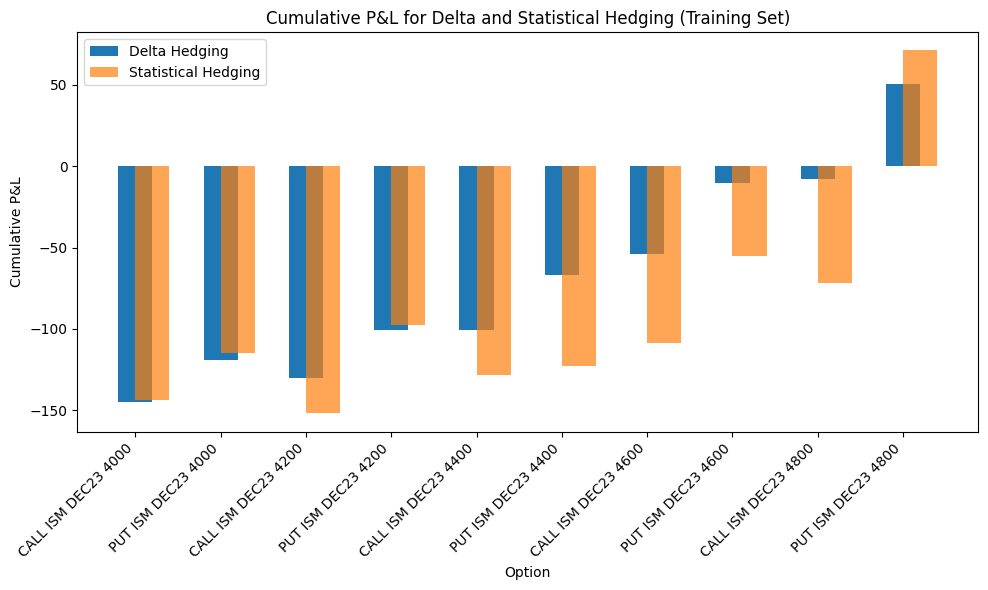

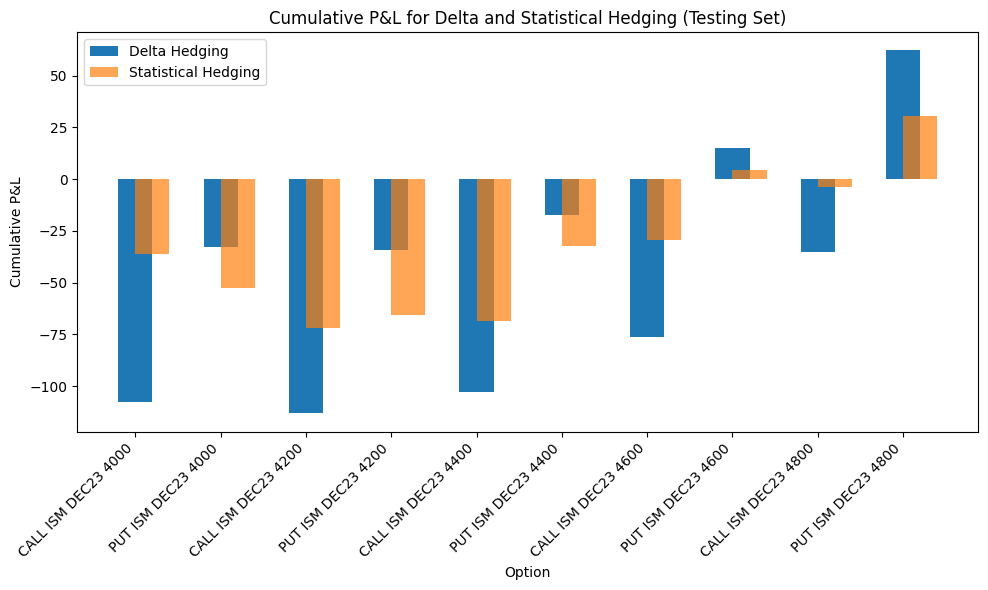

In [ ]:
hedge_ratio_model = Model(inputs=hedge.input, outputs=hedge.get_layer('hedge_ratio').output)

hedge_ratio_train = hedge_ratio_model.predict([x_train, x2_train])
hedge_ratio_test = hedge_ratio_model.predict([x_test, x2_test])

delta = data[delta_columns].values
delta = delta[:-1]

x2_array = data[continuous_futures_price_column].diff().shift(-1)[:-1]
x2_array = np.repeat(x2_array, 10).values
x2_array =x2_array.reshape((462, 10))

y_array = np.diff(data[price_columns].values, axis = 0)

x_train = x[random_numbers]
x2_train = x2[random_numbers]
y_train = y[random_numbers]

x_test = np.delete(x, random_numbers, axis=0)
x2_test = np.delete(x2, random_numbers, axis=0)
y_test = np.delete(y, random_numbers, axis=0)

leng = 462 - n_steps_in

delta = delta[-leng:]
delta_train = delta[random_numbers]
delta_test = np.delete(delta, random_numbers, axis=0)
x2_array = x2_array[-leng:]
x2_array_train = x2_array[random_numbers]
x2_array_test = np.delete(x2_array, random_numbers, axis=0)
y_array = y_array[-leng:]
y_array_train = y_array[random_numbers]
y_array_test = np.delete(y_array, random_numbers, axis=0)

error_delta_train = y_array_train - delta_train * x2_array_train
error_nn_train = y_array_train - hedge_ratio_train * x2_array_train

error_delta_test = y_array_test - delta_test * x2_array_test
error_nn_test = y_array_test - hedge_ratio_test * x2_array_test

mse_delta_train = np.sum(error_delta_train**2, axis=0)/len(y_array)
pnl_delta_train = np.sum(error_delta_train, axis=0)
mse_nn_train = np.sum(error_nn_train**2, axis=0)/len(y_array)
pnl_nn_train = np.sum(error_nn_train, axis=0)

mse_delta_test = np.sum(error_delta_test**2, axis=0)/len(y_array)
pnl_delta_test = np.sum(error_delta_test, axis=0)
mse_nn_test = np.sum(error_nn_test**2, axis=0)/len(y_array)
pnl_nn_test = np.sum(error_nn_test, axis=0)

def plot_comparison(pnl_delta, pnl_stat, dataset_name=''):
    plt.figure(figsize=(10, 6))

    # Plot the P&L for each option for both delta and statistical hedging
    plt.bar(range(len(pnl_delta)), pnl_delta, width=0.4, label='Delta Hedging', align='center')
    plt.bar(range(len(pnl_stat)), pnl_stat, width=0.4, label='Statistical Hedging', align='edge', alpha=0.7)

    # Set the labels for the plot
    plt.xticks(range(len(pnl_delta)), price_columns, rotation=45, ha='right')
    plt.xlabel('Option')
    plt.ylabel('Cumulative P&L')
    plt.title(f'Cumulative P&L for Delta and Statistical Hedging ({dataset_name} Set)')
    plt.legend()
    plt.tight_layout()

    plt.show()

plot_comparison(pnl_delta_train, pnl_nn_train, 'Training')
plot_comparison(pnl_delta_test, pnl_nn_test, 'Testing')

# **Final Comments:**
In this comprehensive analysis of various hedging strategies, we evaluated five different models: Delta Hedging, Statistical Hedging with Linear Regression, LSTM Neural Network on Daily Variation, and LSTM Neural Network on Option Deltas, as well as a Dual-Branch Neural Network approach. Each model exhibited unique strengths and weaknesses across training and testing datasets:

1. Delta Hedging served as our baseline, demonstrating consistent performance across different option strikes. However, it was outperformed in several scenarios by more sophisticated statistical hedging methods.
2. Statistical Hedging with Linear Regression generally underperformed in the training set but showed superior results in the testing set, especially for strikes below 4600. This model proved to be more adaptive to market conditions, indicating its potential in certain trading scenarios, although it struggled with high-strike options.
3. The LSTM Neural Network on Daily Variation provided a greater profit than Delta Hedging but did not achieve the desired outcome of minimizing P&L variability. This suggests that while the model can capture profitable opportunities, it may not consistently reduce risk as intended.
4. The LSTM Neural Network on Option Deltas significantly outperformed Delta Hedging, particularly improving the performance with high-strike put options, though it continued to face challenges with high-strike call options. This model demonstrated a strong capability to enhance returns by better capturing the dynamics of option deltas.
5. Lastly, the Dual-Branch Neural Network showed a promising start with a better mean squared error (MSE) on the training set but did not consistently outperform Delta Hedging on the test set. While it achieved better P&L in some cases, this was attributed to potential luck rather than a definitive improvement in hedging strategy.